# Importing packages

In [1]:
import os
starting_directory = os.getcwd()
print(os.getcwd())

new_dirrectory = '/blue/ferrallm/mcremer/CardiacAmyloidosisMultipleMyeloma'
os.chdir(new_dirrectory)

/blue/ferrallm/mcremer/cardiac-amyloidosis/040_Mistic_2025/SVMsClinicalSplit


In [2]:
import sys
# sys.path.append('/Users/chriskieslich/Box Sync/Research/featureSelection/')

from mistic.svmSet import svmSet
from mistic.cvSet import cvSet 
from mistic.utility import combined_rank, kernelWrapper, score_svc, perDiff, paramSet

import matplotlib.pyplot as plt   
import numpy as np
import pandas as pd
import copy

from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.metrics import roc_auc_score, confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC

from seaborn import pairplot, clustermap, load_dataset
from scipy.cluster.hierarchy import linkage, dendrogram, leaves_list, fcluster

In [3]:
#some functions I wrote to help with exporting data
def outputToExcel(df_data, fileName_header, fileName_Common, fileName_suffix,
                  parent_dir, folderName, sheetName):
    fileName = fileName_header + fileName_Common + fileName_suffix
    outfile_extension = '.xlsx'
    outfile_boxplts = fileName + outfile_extension
    path_out= os.path.join(parent_dir, folderName, outfile_boxplts)

    if os.path.exists(path_out):
            #if old sheet
            with pd.ExcelWriter(path_out, mode = 'a', if_sheet_exists = 'overlay') as writer:
                    df_data.to_excel(writer, sheet_name = sheetName, index = True)
    else: 
            #new sheet
            with pd.ExcelWriter(path_out) as writer:
                    df_data.to_excel(writer, sheet_name = sheetName, index = True) #if new sheet
    
def outputFiguresPath(fileName_header, fileName_mid, fileName_suff, parent_dir, folderName):
        fileName_header = str(fileName_header)
        fileName_mid = str(fileName_mid)
        fileName_suff = str(fileName_suff)

        #cleaning the input to prevent addition of / to the directory
        fileName_header = fileName_header.replace("/", "-")
        fileName_mid = fileName_mid.replace("/", "-")
        fileName_suff = fileName_suff.replace("/", "-")

        fileName = fileName_header + fileName_mid +fileName_suff
        out_filename = fileName + '.tif'
        new_filepath = os.path.join(parent_dir, folderName, out_filename)
        #the output path can be used to save the figure
        return new_filepath
        # plt.savefig(new_filepath, bbox_inches = 'tight')

def makeFolderPathForData(parent_dir, folderName_header, folderName_common, folderName_suffix):
    #makes a new directory for your files
    #returns the folder name for use in other functions
    folderName = folderName_header + folderName_common + folderName_suffix
    path = os.path.join(parent_dir,folderName)
    if not os.path.exists(path):
        os.mkdir(path)
    return folderName

# directory management

In [4]:
# this is written to work out of the blue folder on hpg 

#for file outputs
fileName_header = "SVM_linear_" #what data did you put in
fileName_common = "ParamsOnly_clinSplit_second_red025_" #what was performed on the data, for figures, this may be added to
fileName_suffix = "_250716_v1" #date and versioning

saving_dirrectory = os.path.join("012 Processed Data","019_clinicalSplit", "SecondFeatRed")
if not os.path.exists(saving_dirrectory):
    os.mkdir(saving_dirrectory)
    
makingFolder = makeFolderPathForData(parent_dir = saving_dirrectory, 
                                     folderName_header = "SVM_linear_ParamsOnly_clinSplit_second_red025_", 
                                     folderName_common= "250716_", 
                                     folderName_suffix = "v1")

dataFrameFolderOut =  makingFolder #"SVM_Mistic_Output_2024-07-19_v2"
pickleFolderOut = makingFolder

figDirectory = os.path.join("012 Processed Data","019_clinicalSplit")
figFolder = makingFolder 


In [5]:
import matplotlib as mpl

mpl.rcParams['figure.dpi'] = 300

In [6]:
#parameters of SVM 
red_factor = 0

#cross validation and splitting 
test_size_numb = 1/5
numb_sets = 5

rank_weights = [0, 0.15, 0.2, 0.25, 0.3, 0.4, 0.50, 0.6, 0.75, 0.9, 1]

In [7]:
# test set patients selected 1/5 from the sorted mean KPS scores for the CA+ and CA- subgroups of all patients
testSetPatients = ['T-01', 'B-02', 'I-01', 'Y-02', 'F-03', 'B-03', 'F-01', 'G-03', 'Q-01', 'C-01']
trainSetPatients = ['C-03', 'E-01', 'E-02', 'G-02', 'I-03', 'J-02', 'K-02', 'M-02', 'N-03', 'O-03', 'Q-02', 'Q-03', 'V-02', 'W-01', 'X-01', 'X-02',
                    'A-02', 'C-02', 'E-03', 'H-01', 'H-02', 'M-01', 'N-01', 'N-02', 'P-01', 'P-02', 'R-01', 'R-03', 'S-02', 'T-02', 'V-01', 'W-02', 'Y-01', 'Z-01']

# importing our data

In [8]:
dataFileName = "DF_SVM_noNotes_t-60_ParamsOnly_sk__20250506_v1.xlsx"

In [9]:
# "C:\Users\maega\UFL Dropbox\Maegan Cremer\research-share\Maegan\Projects\Cardiac-Amyloidosis-Multiple-Myeloma\015_Mistic2025\DFsForSVM_noNotes_t-60__20250506_v1\DF_SVM_noNotes_t-60_ParamsOnly_sk__20250506_v1.xlsx"

In [10]:
#file for the feature list
priorFeaturesName = 'SVM_model_comparison_ClinicalSplit.xlsx'
#sheets with prior selected features for this same starting feature list "feature selection"
#header rows 2, 'model' , 'feature reduction', in column 0
priorFeatures_df = pd.read_excel(priorFeaturesName, sheet_name='best feats', header = [0,1]) #data set we are using
priorModel = 'ParamsOnly' #original data conditions
priorFeatureRed = 0.25 #feature reduction rate

priorFeaturesList = list(priorFeatures_df[priorModel, priorFeatureRed].dropna())

x_columns_toKeep = priorFeaturesList #features to use in the initial feature list

In [11]:
# Import dataset
dataTable = pd.read_excel(dataFileName, sheet_name = "knownPts", header = 0) #the dataset we are using

dataTable.index = dataTable['DeID']

#columns to drop from the x data (samples and features)
x_columns_toDrop = ['DeID', 'CA_status_yes']

#columns to use for the y data 
y_column_Classification = 'CA_status_yes'

X = dataTable.copy()
X.drop(columns=x_columns_toDrop,inplace=True)
x_columns_Compare = [feature for feature in x_columns_toKeep if feature in X.columns]
X = X[x_columns_Compare]


binary_feats = []
for col in X.columns:
    unique_values = X[col].unique()
    if len(unique_values) == 2:
        binary_feats.append(X.columns.get_loc(col))
X.iloc[:,binary_feats]    

""
DeID
B-02
C-03
E-01
E-02
F-03
G-02
I-01
I-03
J-02


# Setting up classifier

## Scaling data and defining test set

In [12]:
scaler = StandardScaler().set_output(transform = 'pandas')
scaler.fit(X)

X_all = scaler.transform(X)
y_all = dataTable[y_column_Classification]

# X_train, X_test, y_train, y_test = train_test_split(X_all, y_all, 
#                                                     stratify = y_all, 
#                                                     random_state= randomSeed, 
#                                                     test_size= test_size_numb)

X_train = X_all.loc[trainSetPatients]
y_train = y_all.loc[trainSetPatients]
X_test = X_all.loc[testSetPatients]
y_test = y_all.loc[testSetPatients]

# max(X_all[:,0])
X_all.max().max()

5.410047129712189

In [13]:
ID_track_all = dataTable['DeID'].reset_index(drop= True)
ID_track_train = dataTable['DeID'].loc[trainSetPatients].reset_index(drop= True)
ID_track_test= dataTable['DeID'].loc[testSetPatients].reset_index(drop= True)

In [14]:
outputToExcel(df_data=dataTable.loc[trainSetPatients], fileName_header=fileName_header, fileName_Common=fileName_common, fileName_suffix=fileName_suffix, parent_dir=saving_dirrectory,
            folderName= dataFrameFolderOut, sheetName= "train_data")
outputToExcel(df_data=dataTable.loc[testSetPatients], fileName_header=fileName_header, fileName_Common=fileName_common, fileName_suffix=fileName_suffix, parent_dir=saving_dirrectory,
            folderName= dataFrameFolderOut, sheetName= "test_data")

In [15]:
# outputToExcel(df_data=dataTable.loc[list(y_train.index)], fileName_header=fileName_header, fileName_Common=fileName_common, fileName_suffix=fileName_suffix, parent_dir=saving_dirrectory,
#             folderName= dataFrameFolderOut, sheetName= "train_data")
# outputToExcel(df_data=dataTable.loc[list(y_test.index)], fileName_header=fileName_header, fileName_Common=fileName_common, fileName_suffix=fileName_suffix, parent_dir=saving_dirrectory,
#             folderName= dataFrameFolderOut, sheetName= "test_data")

In [16]:
#convert everything to numpy arrays to get the rest to run 
X_train = X_train.to_numpy()
# y_train = y_train.to_numpy()
X_test = X_test.to_numpy()
# y_test = y_test.to_numpy()
X_all = X_all.to_numpy()

In [17]:
X_train

array([[ 1.04926255e-01,  9.70574404e-01, -9.94824864e-02,
        -4.18830468e-01, -4.28446933e-01,  9.57577150e-01,
         9.77663135e-01,  4.97545708e-01,  3.58294834e-01,
        -6.79202967e-01,  8.12055165e-01],
       [-2.44503336e-01,  6.88565169e-02,  2.53483501e-01,
         1.67487201e+00,  1.56827806e-01,  1.14084717e-01,
         1.12100167e+00,  6.35796940e-01,  1.43902515e-01,
         2.56758169e-02, -4.39509812e-01],
       [-3.88789328e-01,  1.09278895e+00,  1.65867922e+00,
        -4.49225957e-01, -3.73658993e-01,  1.15554706e+00,
         7.68088231e-01,  1.60449326e-02,  5.28726307e-01,
        -6.77288816e-01,  5.22297974e-01],
       [-3.27657027e-01,  8.11100326e-01, -4.10933067e-01,
        -3.57797818e-01, -3.30687830e-01,  9.83725456e-01,
         1.95297682e-01, -3.35876419e-01,  4.63690312e-01,
        -6.14364210e-01,  6.00052250e-01],
       [ 4.12726038e-01, -6.89487531e-01,  5.84118993e-01,
         1.76038243e-01,  5.41004713e+00, -7.01243414e-01,
  

## define cross validation

In [18]:
cv_set = cvSet(X = X_train, y = y_train.values)
cv_set.classification(num_sets = numb_sets)

## initiallize SVC and parameter grids

In [19]:
svc = SVC(kernel = 'precomputed', class_weight="balanced", probability=False, tol = 1e-10)

C_range = [2**x for x in range(-8,5)]

kernel_type = "linear"

parameter_grid = []
for cost in C_range:
    parameter_grid.append(paramSet(model={"C": cost},kernel={}))

test = svmSet(svc, cv_set,
              score_method = score_svc().score,
              kernel = kernelWrapper(type = kernel_type),
              separate_parameters = False)

test.tune_models(parameter_grid)
test.performance_ 

{'f1': 0.9428571428571428, 'auc': 1.0, 'score': 0.9714285714285715, 'C': 0.5}

In [20]:
test_y_predict = test.predict(X_test)
decision_values = test.decision_function(X_test)

tn, fp, fn, tp = confusion_matrix(y_test, test_y_predict).ravel()
precision = tp/(tp+fp)
recall = tp/(tp+fn)
specificity = tn/(tn + fp)
f1 = 2*precision*recall/(precision+recall)
auc = roc_auc_score(y_test, decision_values)

dict_temp_blindpred = {"f1": f1, 'auc': auc, 'true neg': tn, 'false pos': fp, 
                       'false neg': fn, 'true pos': tp,
                       'precision or PPV': precision, 
                       'recall or TPR': recall, 'specificity or TNR': specificity}
dict_temp_blindpred


{'f1': 0.7272727272727272,
 'auc': 0.76,
 'true neg': 3,
 'false pos': 2,
 'false neg': 1,
 'true pos': 4,
 'precision or PPV': 0.6666666666666666,
 'recall or TPR': 0.8,
 'specificity or TNR': 0.6}

## testing other models

In [21]:
# first testing other models for comparison

from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.linear_model import LogisticRegression
import lightgbm as lgb
from sklearn.model_selection import cross_val_score
from sklearn.metrics import f1_score

In [22]:
rnd_clf = RandomForestClassifier(random_state=0)
rnd_clf.fit(X_train, y_train)
y_pred = rnd_clf.predict(X_test)
print("F1: ", f1_score(y_test, y_pred, average = 'binary'))
print( "ROC: ", roc_auc_score(y_test, y_pred))
importances = rnd_clf.feature_importances_
forest_importances = pd.Series(importances, index= X.columns)
# fig, ax = plt.subplots()
# forest_importances.plot.bar(ax=ax)
# fig.tight_layout()

F1:  0.6
ROC:  0.6


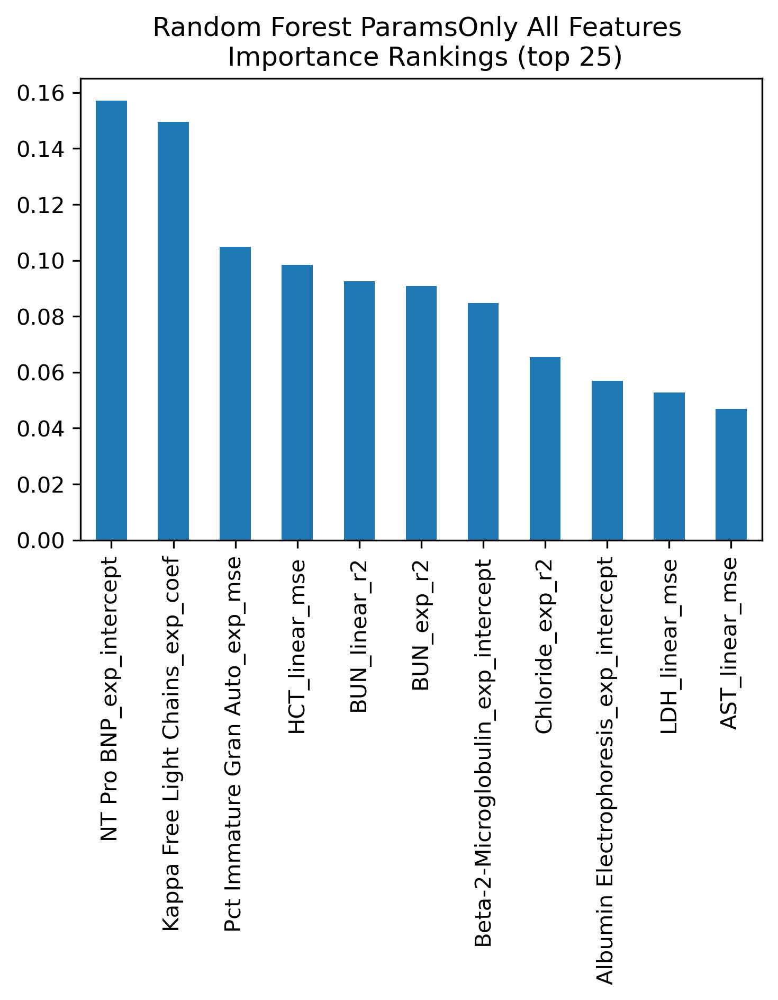

In [23]:
# Sort the importances in descending order and select the top 20 features
top_20_importances = forest_importances.sort_values(ascending=False).head(25)

# Plotting the bar chart for the top 20 features
fig, ax = plt.subplots(figsize = (5,6))
top_20_importances.plot.bar(ax=ax)
fig.tight_layout()
ax.set_title("Random Forest ParamsOnly All Features \n Importance Rankings (top 25)")

# Show the plot
plt.show()

In [24]:
what_train = pd.DataFrame(X_train, columns = X.columns) 
what_test = pd.DataFrame(X_test, columns = X.columns) 

In [25]:
rnd_clf = RandomForestClassifier(random_state=0)
rnd_clf.fit(what_train[list(top_20_importances.index[:9])], y_train)
y_pred = rnd_clf.predict(what_test[list(top_20_importances.index[:9])])
print("F1: ", f1_score(y_test, y_pred, average = 'binary'))
print( "ROC: ", roc_auc_score(y_test, y_pred))
importances = rnd_clf.feature_importances_
forest_importances = pd.Series(importances, index= what_train[list(top_20_importances.index[:9])].columns)

F1:  0.6666666666666666
ROC:  0.7000000000000002


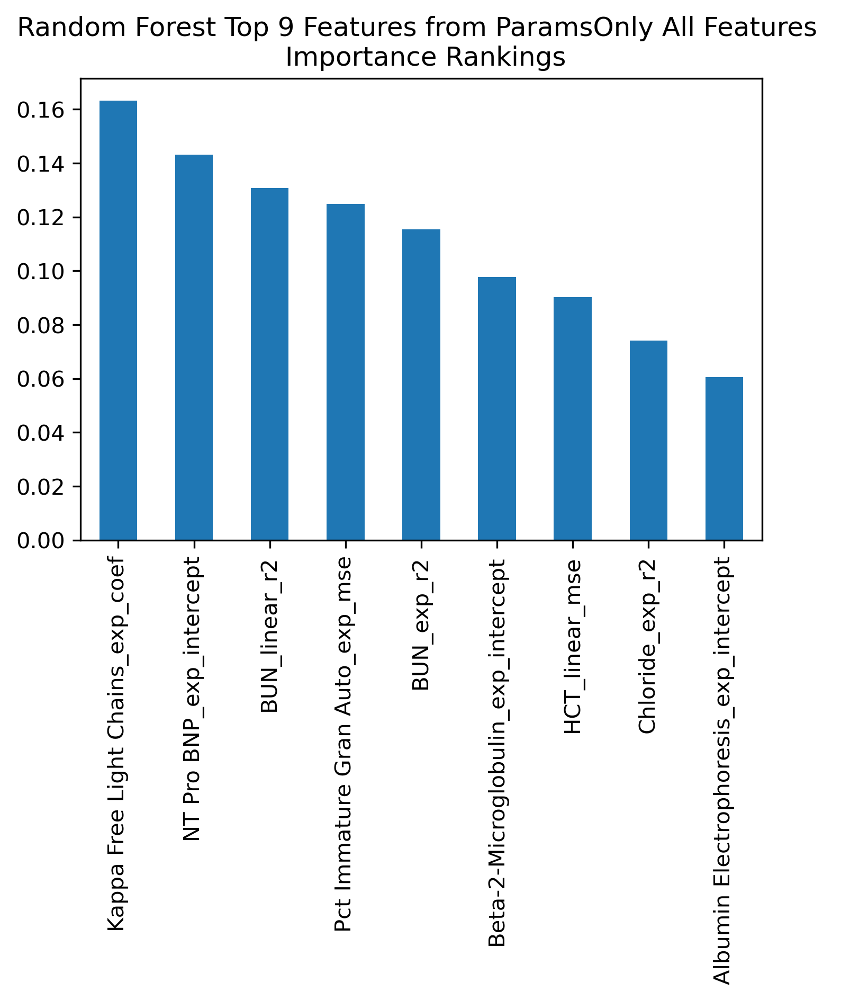

In [26]:
# Plotting the bar chart for the top 20 features
fig, ax = plt.subplots(figsize = (5,6))
forest_importances.sort_values(ascending=False).plot.bar(ax=ax)
fig.tight_layout()
ax.set_title("Random Forest Top 9 Features from ParamsOnly All Features \n Importance Rankings")

# Show the plot
plt.show()

In [27]:
xgb_clf = XGBClassifier()
xgb_clf.fit(X_train, y_train)
y_pred = xgb_clf.predict(X_test)

print("F1: ", f1_score(y_test, y_pred, average = "binary"))
print("ROC: ", roc_auc_score(y_test, y_pred))

importances_xgb = xgb_clf.feature_importances_
xgb_importances = pd.Series(importances_xgb, index= X.columns)
# fig, ax = plt.subplots()
# xgb_importances.plot.bar(ax=ax)
# ax.set_title("XGBoost All Features Importance Rankings")
# fig.tight_layout()

F1:  0.8333333333333334
ROC:  0.8


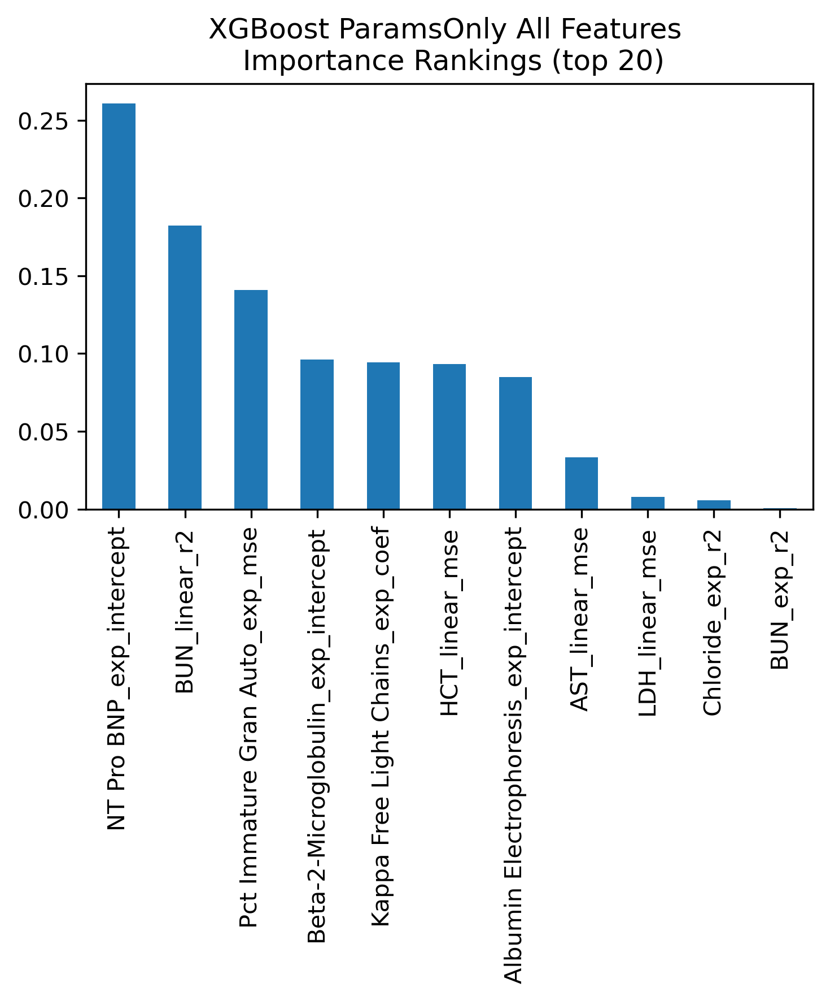

In [28]:
# Sort the importances in descending order and select the top 20 features
top_20_importances = xgb_importances.sort_values(ascending=False).head(20)

# Plotting the bar chart for the top 20 features
fig, ax = plt.subplots(figsize = (5,6))
top_20_importances.plot.bar(ax=ax)
ax.set_title("XGBoost ParamsOnly All Features \n Importance Rankings (top 20)")
fig.tight_layout()

# Show the plot
plt.show()

In [29]:
# paramsLGBM = {
#     'objective': 'binary',
#     'boosting_type':'gbdt',
#     # 'num_leaves' : 45, 
#     'learning_rate' : 0.05,
#     'feature_fraction' : 0.90,
#     'min_data_in_leaf': 1
# }

# lgb_clf = lgb.LGBMClassifier(**paramsLGBM)
# lgb_clf.fit(X_train, y_train)
# y_pred = lgb_clf.predict(X_test)
# # lgb_clf.predict_proba(X_test)

# print("F1: ", f1_score(y_test, y_pred, average = "binary"))
# print("ROC: ", roc_auc_score(y_test, y_pred))
# print(classification_report(y_test, y_pred))

In [30]:
# import shap
# #borrowed from online source and edited
# # create explainer
# explainer = shap.TreeExplainer(lgb_clf)

# #binary predictions
# y_proba = lgb_clf.predict_proba(X_all)[:,1]

# # Calculate SHAP values for the test set
# shap_values = explainer.shap_values(X_all)

# shap.summary_plot(shap_values, X_all, feature_names = X.columns)


# # bar plot for feature importances
# # shap.summary_plot(shap_values_reshaped[1], X_test, plot_type="bar")

# # Show the plot
# plt.show()

# feature selection

In [31]:
svm_set_ranks = []
for i in range(len(rank_weights)):
    print(f"Rank weight: {rank_weights[i]:.2f}") 
    svm_set_ranks.append(svmSet(svc, cv_set,
                                score_method = score_svc().score,
                                kernel = kernelWrapper(type = kernel_type),
                                separate_feature_sets = False,
                                separate_parameters = False,
                                sparse_kernel_matrix = False))

    svm_set_ranks[i].greedy_backward_selection(parameter_grid = parameter_grid,
                                           reduction_factor = red_factor,
                                           feature_ranker = combined_rank(weight=rank_weights[i]).compute,
                                           set_for_rank = "sample")

Rank weight: 0.00
Number of Features: 11, Score: 0.971
Number of Features: 10, Score: 0.971
Number of Features: 9, Score: 0.946
Number of Features: 8, Score: 0.938
Number of Features: 7, Score: 0.960
Number of Features: 6, Score: 0.949
Number of Features: 5, Score: 0.843
Number of Features: 4, Score: 0.705
Number of Features: 3, Score: 0.676
Number of Features: 2, Score: 0.737
Number of Features: 1, Score: 0.691
Rank weight: 0.15
Number of Features: 11, Score: 0.971
Number of Features: 10, Score: 0.971
Number of Features: 9, Score: 0.946
Number of Features: 8, Score: 0.938
Number of Features: 7, Score: 0.960
Number of Features: 6, Score: 0.949
Number of Features: 5, Score: 0.843
Number of Features: 4, Score: 0.705
Number of Features: 3, Score: 0.676
Number of Features: 2, Score: 0.737
Number of Features: 1, Score: 0.691
Rank weight: 0.20
Number of Features: 11, Score: 0.971
Number of Features: 10, Score: 0.971
Number of Features: 9, Score: 0.946
Number of Features: 8, Score: 0.938
Numb

# Performance plots

## F1 and AUC plots

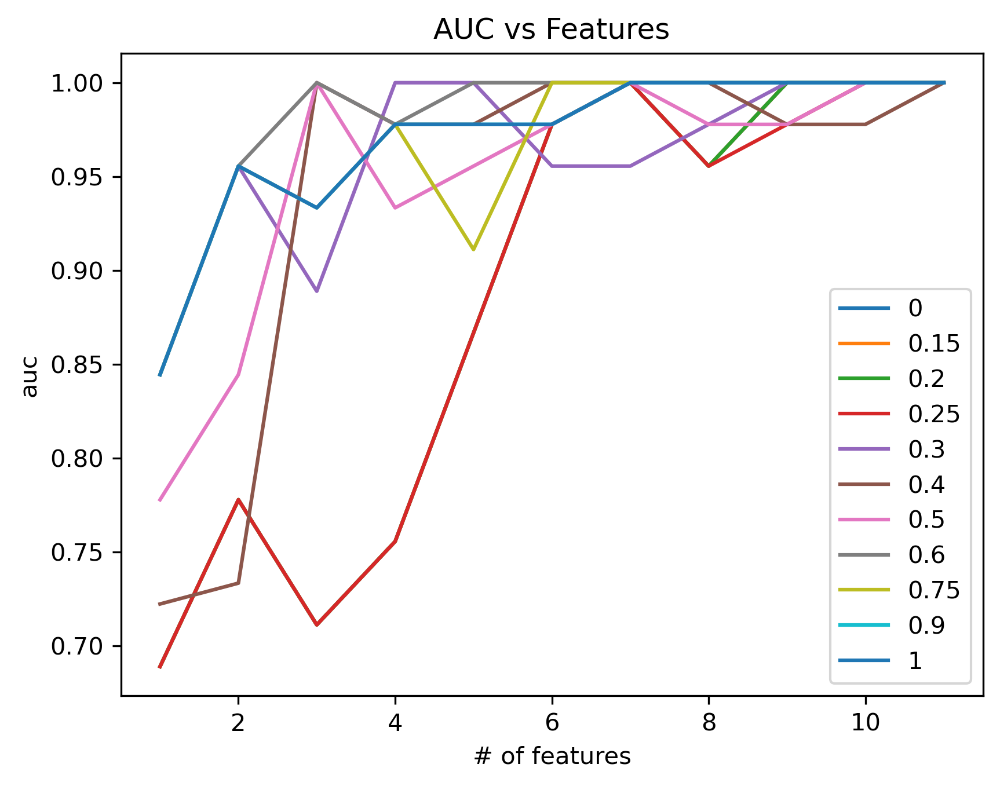

In [32]:
fig, ax = plt.subplots()

for i in range(len(rank_weights)):
    svm_set_ranks[i].plot_performance(metric="auc")

plt.legend(labels=rank_weights)
ax.set_title("AUC vs Features")

#saving figure
figCommon = fileName_common + "_AUC"
figPath = outputFiguresPath(fileName_header=fileName_header, fileName_mid= figCommon, fileName_suff= fileName_suffix, parent_dir= figDirectory, folderName= figFolder)
# fig.savefig(figPath, bbox_inches = 'tight')

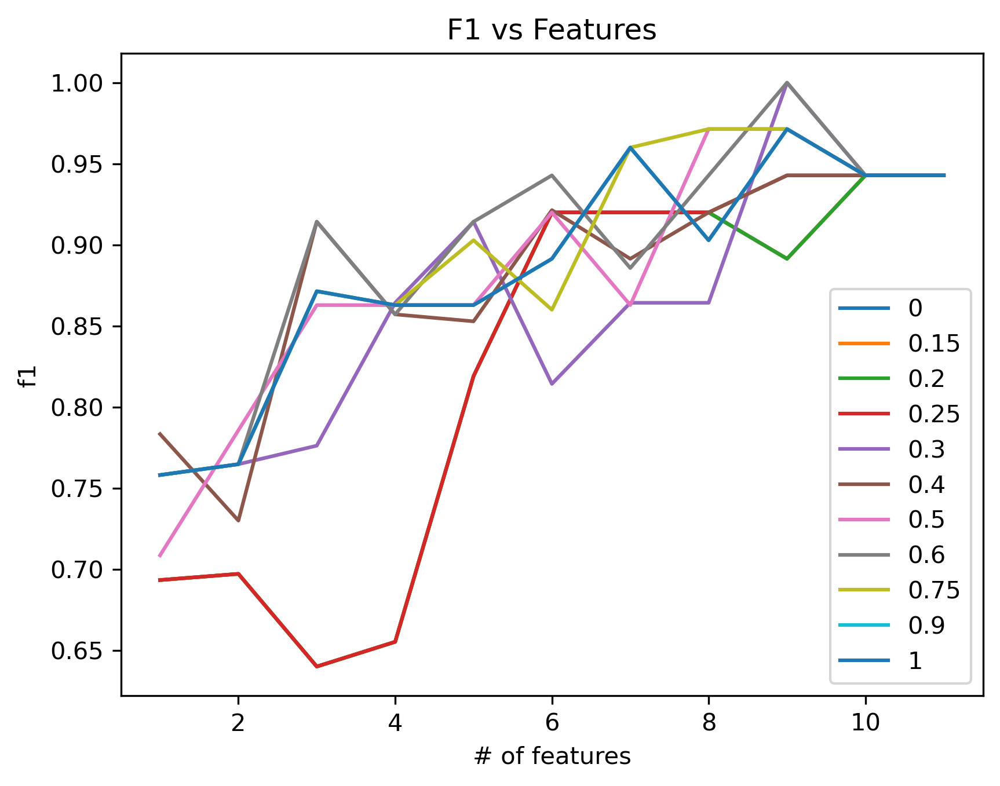

In [33]:
fig, ax = plt.subplots()

for i in range(len(rank_weights)):
    svm_set_ranks[i].plot_performance(metric="f1")

plt.legend(labels=rank_weights)
ax.set_title("F1 vs Features")

#saving figure
figCommon = fileName_common + "_F1"
figPath = outputFiguresPath(fileName_header=fileName_header, fileName_mid= figCommon, fileName_suff= fileName_suffix, parent_dir= figDirectory, folderName= figFolder)
# fig.savefig(figPath, bbox_inches = 'tight')

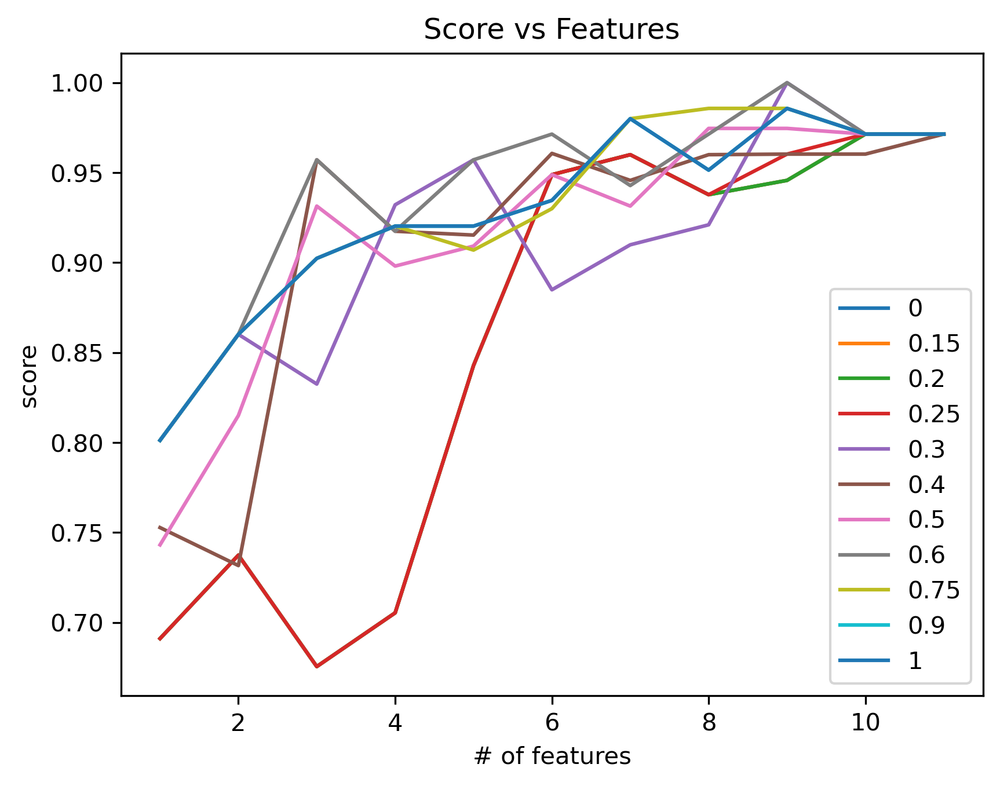

In [34]:
fig, ax = plt.subplots()

for i in range(len(rank_weights)):
    svm_set_ranks[i].plot_performance(metric="score")

plt.legend(labels=rank_weights)
ax.set_title("Score vs Features")

#saving figure
figCommon = fileName_common + "_Score"
figPath = outputFiguresPath(fileName_header=fileName_header, fileName_mid= figCommon, fileName_suff= fileName_suffix, parent_dir= figDirectory, folderName= figFolder)
# fig.savefig(figPath, bbox_inches = 'tight')

# picking best model 

In [35]:
enrich_score = []
for i in range(len(rank_weights)):
    enrich_score.append(svm_set_ranks[i].enrichment_score(type = "auc"))

#selected_run = 4
selected_run = enrich_score.index(max(enrich_score))

enrich_score

[0.7778499278499278,
 0.7778499278499278,
 0.7778499278499278,
 0.7791774891774892,
 0.8323304473304475,
 0.8337049062049062,
 0.8374603174603176,
 0.8577633477633477,
 0.8480952380952381,
 0.8466089466089467,
 0.8466089466089467]

In [36]:
svm_set_ranks[selected_run].performance_

{'f1': 1.0,
 'auc': 1.0,
 'score': 1.0,
 'C': 2,
 'num_features': 9,
 'mean_nSV': 7.4}

In [37]:
score_list = []

for i in range(len(rank_weights)):
    score_list.append(svm_set_ranks[i].performance_['score'])

maxScore = max(score_list)
topModelIndex = score_list.index(maxScore)


In [38]:
#saving the feature ranking, performance, and model evaluations to spreadsheets

for i in range(len(rank_weights)):
    #collecting the performance as a dataframe
    df_bestPerformance = pd.DataFrame.from_dict(svm_set_ranks[i].performance_, orient = 'index')
    outputToExcel(df_data=df_bestPerformance, fileName_header=fileName_header, fileName_Common=fileName_common, fileName_suffix=fileName_suffix, parent_dir=saving_dirrectory,
                folderName= dataFrameFolderOut, sheetName= str(rank_weights[i]).replace(".", "") + "_best model perf")


    df_bestFeatures= pd.DataFrame(list(X.columns[svm_set_ranks[i].features]))
    #saving the best features
    outputToExcel(df_data=df_bestFeatures, fileName_header=fileName_header, fileName_Common=fileName_common, fileName_suffix=fileName_suffix, parent_dir=saving_dirrectory,
                folderName= dataFrameFolderOut, sheetName= str(rank_weights[i]).replace(".","") + "_features")




In [39]:
iterator = 1
for i in range(len(rank_weights)):
    if iterator == 1:
        #create the df_performance and collect the performance information
        df_performance = pd.DataFrame.from_dict(svm_set_ranks[i].performance_, orient = 'index', columns = [str(rank_weights[i])]).T

        #create feature list dataframe 
        df_features = pd.DataFrame(list(X.columns[svm_set_ranks[i].features]), columns=[str(rank_weights[i])])
        iterator = iterator + 1 #to increment
    else:
        #collect the data and add it to the existing frames
        df_temp_perf = pd.DataFrame.from_dict(svm_set_ranks[i].performance_, orient = 'index', columns = [str(rank_weights[i])]).T
        df_temp_features = pd.DataFrame(list(X.columns[svm_set_ranks[i].features]), columns=[str(rank_weights[i])])
        #concatinate with pervious
        df_performance = pd.concat([df_performance, df_temp_perf], axis =0)
        df_features = pd.concat([df_features, df_temp_features], axis = 1)
        iterator = iterator + 1

#saving the features and performance
outputToExcel(df_data=df_performance, fileName_header=fileName_header, fileName_Common=fileName_common, fileName_suffix=fileName_suffix, parent_dir=saving_dirrectory,
            folderName= dataFrameFolderOut, sheetName= "concat_best model perf")

outputToExcel(df_data=df_features, fileName_header=fileName_header, fileName_Common=fileName_common, fileName_suffix=fileName_suffix, parent_dir=saving_dirrectory,
            folderName= dataFrameFolderOut, sheetName= "concat_features")

iterator = 1
dict_blindprediction = {} #index is the weight
for i in range(len(rank_weights)):
    decision_values = svm_set_ranks[i].decision_function(X_test)
    y_pred = svm_set_ranks[i].predict(X_test)

    tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()
    precision = tp/(tp+fp)
    recall = tp/(tp+fn)
    specificity = tn/(tn + fp)
    f1 = 2*precision*recall/(precision+recall)
    auc = roc_auc_score(y_test, decision_values)

    dict_temp_blindpred = {"f1": f1, 'auc': auc, 'true neg': tn, 'false pos': fp, 'false neg': fn, 'true pos': tp,
                           'precision or PPV': precision, 'recall or TPR': recall, 'specificity or TNR': specificity}
    if iterator == 1:
        df_blindprediction = pd.DataFrame.from_dict(data = dict_temp_blindpred, orient = 'index', columns = [str(rank_weights[i])]).T
        iterator = iterator +1
    else:
        df_temp_blindpred = pd.DataFrame.from_dict(data = dict_temp_blindpred, orient = 'index', columns = [str(rank_weights[i])]).T
        df_blindprediction = pd.concat([df_blindprediction, df_temp_blindpred], axis = 0)
        iterator = iterator + 1
    # print(df_temp_blindpred)
    # dict_blindprediction[str(rank_weights[i])] = df_temp_blindpred

# df_blindprediction = pd.DataFrame.from_dict(dict_blindprediction, orient= 'index')
outputToExcel(df_data=df_blindprediction, fileName_header=fileName_header, fileName_Common=fileName_common, fileName_suffix=fileName_suffix, parent_dir=saving_dirrectory,
            folderName= dataFrameFolderOut, sheetName= "concat_blindprediction")


In [40]:
df_blindprediction

,f1,auc,true neg,false pos,false neg,true pos,precision or PPV,recall or TPR,specificity or TNR
0,0.600000,0.76,3.0,2.0,2.0,3.0,0.600000,0.6,0.6
0.15,0.600000,0.76,3.0,2.0,2.0,3.0,0.600000,0.6,0.6
0.2,0.600000,0.76,3.0,2.0,2.0,3.0,0.600000,0.6,0.6
0.25,0.600000,0.76,3.0,2.0,2.0,3.0,0.600000,0.6,0.6
0.3,0.727273,0.76,3.0,2.0,1.0,4.0,0.666667,0.8,0.6
0.4,0.727273,0.76,3.0,2.0,1.0,4.0,0.666667,0.8,0.6
0.5,0.727273,0.76,3.0,2.0,1.0,4.0,0.666667,0.8,0.6
0.6,0.727273,0.76,3.0,2.0,1.0,4.0,0.666667,0.8,0.6
0.75,0.600000,0.76,3.0,2.0,2.0,3.0,0.600000,0.6,0.6
0.9,0.600000,0.76,3.0,2.0,2.0,3.0,0.600000,0.6,0.6


In [41]:
df_performance

,f1,auc,score,C,num_features,mean_nSV
0,0.942857,1.000000,0.971429,0.5,10.0,10.8
0.15,0.942857,1.000000,0.971429,0.5,10.0,10.8
0.2,0.942857,1.000000,0.971429,0.5,10.0,10.8
0.25,0.942857,1.000000,0.971429,0.5,10.0,10.8
0.3,1.000000,1.000000,1.000000,2.0,9.0,8.8
0.4,0.942857,1.000000,0.971429,0.5,11.0,10.4
0.5,0.971429,0.977778,0.974603,2.0,8.0,7.2
0.6,1.000000,1.000000,1.000000,2.0,9.0,7.4
0.75,0.971429,1.000000,0.985714,0.5,8.0,10.6
0.9,0.971429,1.000000,0.985714,0.5,9.0,10.2


In [42]:
df_features

,0,0.15,0.2,0.25,0.3,0.4,0.5,0.6,0.75,0.9,1
0,AST_linear_mse,AST_linear_mse,AST_linear_mse,AST_linear_mse,AST_linear_mse,AST_linear_mse,AST_linear_mse,AST_linear_mse,AST_linear_mse,AST_linear_mse,AST_linear_mse
1,BUN_linear_r2,BUN_linear_r2,BUN_linear_r2,BUN_linear_r2,BUN_linear_r2,BUN_linear_r2,LDH_linear_mse,BUN_linear_r2,Albumin Electrophoresis_exp_intercept,BUN_linear_r2,BUN_linear_r2
2,HCT_linear_mse,HCT_linear_mse,HCT_linear_mse,HCT_linear_mse,HCT_linear_mse,HCT_linear_mse,BUN_exp_r2,LDH_linear_mse,BUN_exp_r2,Albumin Electrophoresis_exp_intercept,Albumin Electrophoresis_exp_intercept
3,LDH_linear_mse,LDH_linear_mse,LDH_linear_mse,LDH_linear_mse,LDH_linear_mse,LDH_linear_mse,Beta-2-Microglobulin_exp_intercept,Albumin Electrophoresis_exp_intercept,Beta-2-Microglobulin_exp_intercept,BUN_exp_r2,BUN_exp_r2
4,Albumin Electrophoresis_exp_intercept,Albumin Electrophoresis_exp_intercept,Albumin Electrophoresis_exp_intercept,Albumin Electrophoresis_exp_intercept,Albumin Electrophoresis_exp_intercept,Albumin Electrophoresis_exp_intercept,Chloride_exp_r2,BUN_exp_r2,Chloride_exp_r2,Beta-2-Microglobulin_exp_intercept,Beta-2-Microglobulin_exp_intercept
5,Beta-2-Microglobulin_exp_intercept,Beta-2-Microglobulin_exp_intercept,Beta-2-Microglobulin_exp_intercept,Beta-2-Microglobulin_exp_intercept,Beta-2-Microglobulin_exp_intercept,BUN_exp_r2,Kappa Free Light Chains_exp_coef,Beta-2-Microglobulin_exp_intercept,Kappa Free Light Chains_exp_coef,Chloride_exp_r2,Chloride_exp_r2
6,Chloride_exp_r2,Chloride_exp_r2,Chloride_exp_r2,Chloride_exp_r2,Kappa Free Light Chains_exp_coef,Beta-2-Microglobulin_exp_intercept,Pct Immature Gran Auto_exp_mse,Kappa Free Light Chains_exp_coef,Pct Immature Gran Auto_exp_mse,Kappa Free Light Chains_exp_coef,Kappa Free Light Chains_exp_coef
7,Kappa Free Light Chains_exp_coef,Kappa Free Light Chains_exp_coef,Kappa Free Light Chains_exp_coef,Kappa Free Light Chains_exp_coef,Pct Immature Gran Auto_exp_mse,Chloride_exp_r2,NT Pro BNP_exp_intercept,Pct Immature Gran Auto_exp_mse,NT Pro BNP_exp_intercept,Pct Immature Gran Auto_exp_mse,Pct Immature Gran Auto_exp_mse
8,Pct Immature Gran Auto_exp_mse,Pct Immature Gran Auto_exp_mse,Pct Immature Gran Auto_exp_mse,Pct Immature Gran Auto_exp_mse,NT Pro BNP_exp_intercept,Kappa Free Light Chains_exp_coef,NaN,NT Pro BNP_exp_intercept,NaN,NT Pro BNP_exp_intercept,NT Pro BNP_exp_intercept
9,NT Pro BNP_exp_intercept,NT Pro BNP_exp_intercept,NT Pro BNP_exp_intercept,NT Pro BNP_exp_intercept,NaN,Pct Immature Gran Auto_exp_mse,NaN,NaN,NaN,NaN,NaN


## best model performance

In [43]:
print("rank weights: ", str(rank_weights[selected_run]))
print(df_performance.iloc[selected_run])
print(df_blindprediction.iloc[selected_run])

rank weights:  0.6
f1              1.0
auc             1.0
score           1.0
C               2.0
num_features    9.0
mean_nSV        7.4
Name: 0.6, dtype: float64
f1                    0.727273
auc                   0.760000
true neg              3.000000
false pos             2.000000
false neg             1.000000
true pos              4.000000
precision or PPV      0.666667
recall or TPR         0.800000
specificity or TNR    0.600000
Name: 0.6, dtype: float64


In [44]:
df_features[str(rank_weights[selected_run])].dropna()

0                           AST_linear_mse
1                            BUN_linear_r2
2                           LDH_linear_mse
3    Albumin Electrophoresis_exp_intercept
4                               BUN_exp_r2
5       Beta-2-Microglobulin_exp_intercept
6         Kappa Free Light Chains_exp_coef
7           Pct Immature Gran Auto_exp_mse
8                 NT Pro BNP_exp_intercept
Name: 0.6, dtype: object

## pair plots

In [45]:
import plotly.express as px
from seaborn import pairplot, clustermap, load_dataset
# fig, ax = plt.subplots()

palette = {np.int64(1) :'red', np.int64(0): 'blue'} #our data is of int64

# selected_model = 0
top_features = X.columns[svm_set_ranks[selected_run].sorted_features.astype(int)[:svm_set_ranks[selected_run].performance_["num_features"]]].values
fig = pairplot(dataTable[np.append(top_features, y_column_Classification)],
         hue=y_column_Classification, corner=True, palette=palette)
fig.fig.suptitle(f"Rank weight: {rank_weights[selected_run]:.2f}", y=1.08)

#saving figure
figCommon = fileName_common + str(rank_weights[selected_run]).replace(".", "") + "_pairplot"
figPath = outputFiguresPath(fileName_header=fileName_header, fileName_mid= figCommon, fileName_suff= fileName_suffix, parent_dir= figDirectory, folderName= figFolder)
# fig.savefig(figPath, bbox_inches = 'tight')

## 3D scatter

In [46]:
top3_features = X.columns[svm_set_ranks[selected_run].sorted_features.astype(int)[:3]].values
fig = px.scatter_3d(dataTable, x=top3_features[0], y=top3_features[1], z=top3_features[2],
          color=y_column_Classification)
fig.update_traces(marker_size = 4)
fig.show()

## integrated gradients attribution

/blue/ferrallm/mcremer/CardiacAmyloidosisMultipleMyeloma/mistic/utility.py:223: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



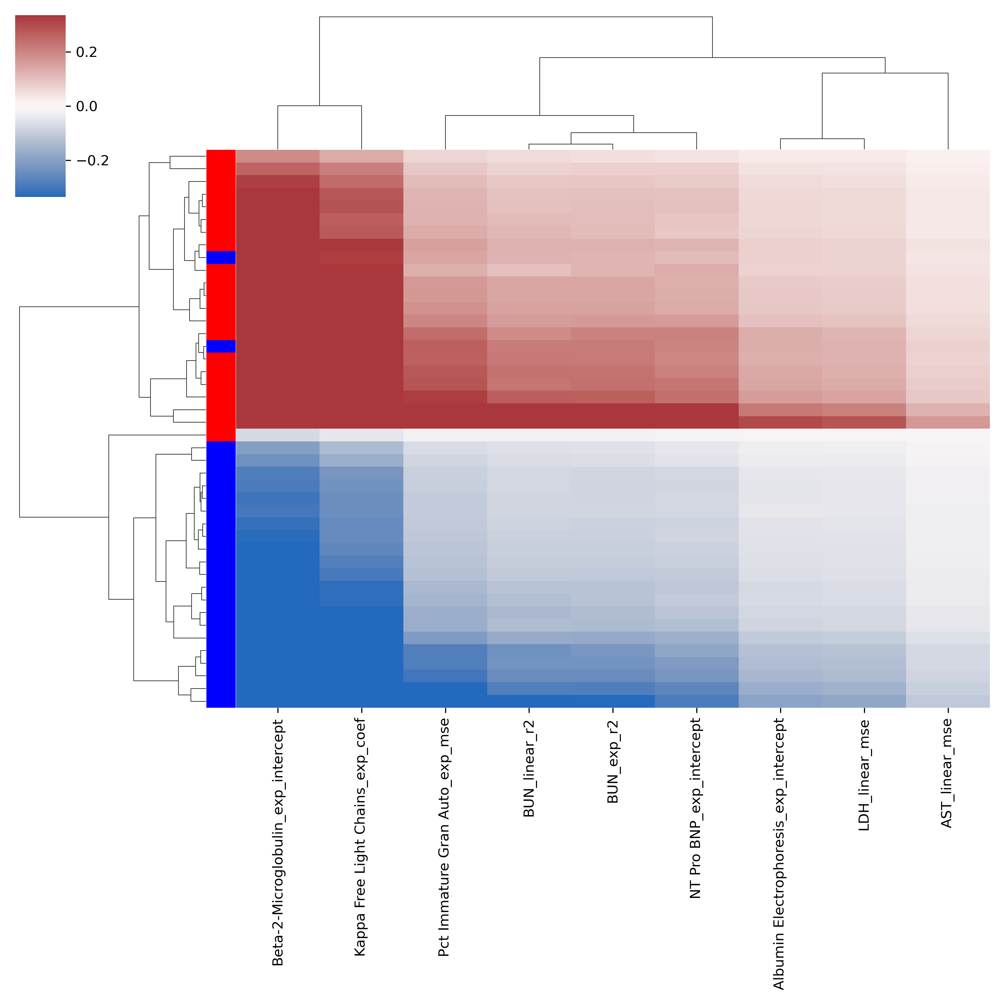

In [47]:
IG = svm_set_ranks[selected_run].integrated_gradient(X_all)
IGtable = pd.DataFrame(IG,columns=X.columns[svm_set_ranks[selected_run].features])

# IGtable.index =ID_track_all #updating index so that the plot has the patient names on it

features = svm_set_ranks[selected_run].features
IG_X = pd.DataFrame(X_all[:,features],columns = IGtable.columns)
#IG_X = X.iloc[:,features]
N = len(IGtable)

# from seaborn import pairplot, clustermap, load_dataset
# from scipy.cluster.hierarchy import linkage, dendrogram, leaves_list, fcluster

linkMeth = "average"

distMatCol = perDiff(IGtable)
hcCol = linkage(distMatCol, method=linkMeth,optimal_ordering=True)

tr_IGtable = IGtable.transpose()
distMatRow = perDiff(tr_IGtable)
hcRow = linkage(distMatRow, method=linkMeth,optimal_ordering=True)

color_val = max(np.abs((np.mean(IG)-np.std(IG), np.mean(IG)+np.std(IG))))

#fig, ax = plt.subplots()
fig = clustermap(IGtable, 
           yticklabels=False,
           cmap="vlag", vmin=-color_val, vmax=color_val,
           row_linkage=hcRow, col_linkage=hcCol, 
           row_colors=[["red","blue"][int(l==np.int64(0))+0] for l in y_all])

In [48]:
import plotly.graph_objects as go
import plotly.express as px

nbins = 10
scale = 0.1
n_features = len(X.columns[svm_set_ranks[selected_run].sorted_features.astype(int)[:svm_set_ranks[selected_run].performance_["num_features"]]].values)
spacing = 2
min_max_IG = 2.5

fig = go.Figure()
fig.update_layout(
    plot_bgcolor='white',
    autosize=False,
    width=1000,
    height=600,
    coloraxis = {'colorscale':'Bluered'},
    xaxis_title = "Integrated Gradient",
)
 
fig.update_xaxes(
    zeroline=True,
    zerolinecolor="black",
    range = [-min_max_IG,min_max_IG]
    )
fig.update_yaxes(
    zeroline=True,
    zerolinecolor="black",
    mirror=True,
    ticks='outside',
    showline=True,
    linecolor='black',
    gridcolor='lightgrey',
    range = [-spacing, spacing*n_features + spacing]
)
 
feature_rank = np.argsort(np.sum(abs(IG),axis=0))
feature_order = feature_rank[(len(feature_rank)-n_features):len(feature_rank)] 

y_val = 1
bin_ids = list(range(nbins))
for f in feature_order:
    bins = np.linspace(IGtable.iloc[:,f].min()*1.1,IGtable.iloc[:,f].max()*1.1,nbins+1)
    ig_bins = pd.cut(IGtable.iloc[:,f], bins=bins, labels=bin_ids)
 
    x_vals = []
    y_vals = []
    f_vals = []
    for bin in bin_ids:
        x_bin_vals = list(IGtable.iloc[ig_bins[ig_bins == bin].index,f].values)
        n_pts = len(x_bin_vals)
        if n_pts > 0:
            x_vals = x_vals + x_bin_vals
            y_vals = y_vals + list(y_val + scale*(np.array(list(range(n_pts)))-(n_pts-1)/2))
            f_vals = f_vals + list(IG_X.iloc[ig_bins[ig_bins == bin].index,f].values)
    fig.add_trace(go.Scatter(
        x = x_vals, 
        y = y_vals,
        mode = 'markers',
        marker = dict(size=12,
                      color = f_vals,
                      coloraxis = "coloraxis",
                     ),
        name=IGtable.columns[f],
    ))
    y_val += spacing
 
 
fig.update_layout(showlegend=False, coloraxis_showscale=True,font=dict(size=20))
fig.update_coloraxes(colorbar_showticklabels=False,
                    colorbar_title=dict(text="Feature Value",side = "right"),
                    cmin = -1, cmax = 1)
fig.update_yaxes(tickvals=[1]+[1 + spacing*i for i in range(1,n_features)], 
                 ticktext=IGtable.columns[feature_order])
 
fig.show()

In [49]:
nbins = 10
scale = 0.1
n_features = 5 #this picks the top 5 features
spacing = 2
min_max_IG = 2.5

fig = go.Figure()
fig.update_layout(
    plot_bgcolor='white',
    autosize=False,
    width=1000,
    height=1000,
    coloraxis = {'colorscale':'Bluered'},
    xaxis_title = "Integrated Gradient",
)
 
fig.update_xaxes(
    zeroline=True,
    zerolinecolor="black",
    range = [-min_max_IG,min_max_IG]
    )
fig.update_yaxes(
    zeroline=True,
    zerolinecolor="black",
    mirror=True,
    ticks='outside',
    showline=True,
    linecolor='black',
    gridcolor='lightgrey',
    range = [-spacing, spacing*n_features + spacing]
)
 
feature_rank = np.argsort(np.sum(abs(IG),axis=0))
feature_order = feature_rank[(len(feature_rank)-n_features):len(feature_rank)] 

y_val = 1
bin_ids = list(range(nbins))
for f in feature_order:
    bins = np.linspace(IGtable.iloc[:,f].min()*1.1,IGtable.iloc[:,f].max()*1.1,nbins+1)
    ig_bins = pd.cut(IGtable.iloc[:,f], bins=bins, labels=bin_ids)
 
    x_vals = []
    y_vals = []
    f_vals = []
    for bin in bin_ids:
        x_bin_vals = list(IGtable.iloc[ig_bins[ig_bins == bin].index,f].values)
        n_pts = len(x_bin_vals)
        if n_pts > 0:
            x_vals = x_vals + x_bin_vals
            y_vals = y_vals + list(y_val + scale*(np.array(list(range(n_pts)))-(n_pts-1)/2))
            f_vals = f_vals + list(IG_X.iloc[ig_bins[ig_bins == bin].index,f].values)
    fig.add_trace(go.Scatter(
        x = x_vals, 
        y = y_vals,
        mode = 'markers',
        marker = dict(size=12,
                      color = f_vals,
                      coloraxis = "coloraxis",
                     ),
        name=IGtable.columns[f],
    ))
    y_val += spacing
 
 
fig.update_layout(showlegend=False, coloraxis_showscale=True,font=dict(size=20))
fig.update_coloraxes(colorbar_showticklabels=False,
                    colorbar_title=dict(text="Feature Value",side = "right"),
                    cmin = -1, cmax = 1)
fig.update_yaxes(tickvals=[1]+[1 + spacing*i for i in range(1,n_features)], 
                 ticktext=IGtable.columns[feature_order])
 
fig.show()

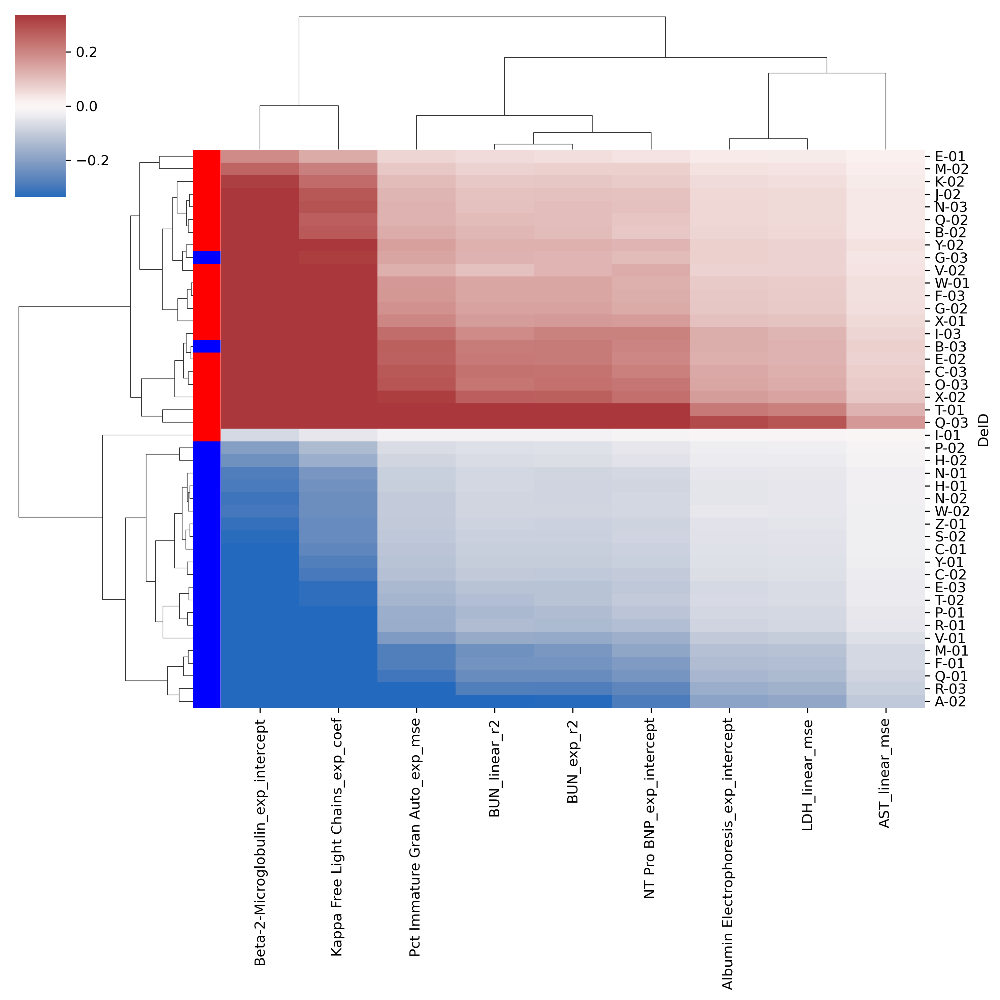

In [50]:
IGtable.index =ID_track_all #updating index so that the plot has the patient names on it

fig = clustermap(IGtable, 
           yticklabels=True,
           cmap="vlag", vmin=-color_val, vmax=color_val,
           row_linkage=hcRow, col_linkage=hcCol, 
           row_colors=[["red","blue"][int(l==np.int64(0))+0] for l in y_all])

In [51]:
feat_1 = IGtable.columns[feature_order[0]]
feat_2 = IGtable.columns[feature_order[1]]

fig = px.scatter(x = IG_X[feat_1], y = IGtable[feat_1], color = IG_X[feat_2])
fig.update_traces(marker=dict(size=12))

fig.update_layout(
    plot_bgcolor='white',
    autosize=False,
    width=800,
    height=800,
    coloraxis = {'colorscale':'Bluered'},
    xaxis_title = feat_1,
    yaxis_title = "Integrated Gradient for " + feat_1,
    font=dict(size=20)
)

fig.update_xaxes(
    zeroline=True,
    zerolinecolor='lightgrey',
    mirror=True,
    ticks='outside',
    showline=True,
    linecolor='black',
    gridcolor='lightgrey'
    )
    
fig.update_yaxes(
    zeroline=True,
    zerolinecolor='lightgrey',
    mirror=True,
    ticks='outside',
    showline=True,
    linecolor='black',
    gridcolor='lightgrey'
)

fig.update_coloraxes(colorbar_showticklabels=False,
                    colorbar_title=dict(text=feat_2,side = "right"),
                    cmin = -1, cmax = 1)

fig.show()

In [52]:
# feat_1 = IGtable.columns[feature_order[5]]
# feat_2 = IGtable.columns[feature_order[6]]

# fig = px.scatter(x = IG_X[feat_1], y = IGtable[feat_1], color = IG_X[feat_2])
# fig.update_traces(marker=dict(size=12))

# fig.update_layout(
#     plot_bgcolor='white',
#     autosize=False,
#     width=800,
#     height=800,
#     coloraxis = {'colorscale':'Bluered'},
#     xaxis_title = feat_1,
#     yaxis_title = "Integrated Gradient for " + feat_1,
#     font=dict(size=20)
# )

# fig.update_xaxes(
#     zeroline=True,
#     zerolinecolor='lightgrey',
#     mirror=True,
#     ticks='outside',
#     showline=True,
#     linecolor='black',
#     gridcolor='lightgrey'
#     )
    
# fig.update_yaxes(
#     zeroline=True,
#     zerolinecolor='lightgrey',
#     mirror=True,
#     ticks='outside',
#     showline=True,
#     linecolor='black',
#     gridcolor='lightgrey'
# )

# fig.update_coloraxes(colorbar_showticklabels=False,
#                     colorbar_title=dict(text=feat_2,side = "right"),
#                     cmin = -1, cmax = 1)

# fig.show()

### test set with support vectors

#### finding support vectors and feature order

In [53]:
#setting feature order equal to feature rank because feature order if altered by number of features plotted in shap plot for the abridged SHAP plot
feature_order = np.argsort(np.sum(abs(IG),axis=0))
#features are ordered from least important to most important

In [54]:
supportVectorIDs = ID_track_train[pd.DataFrame([svm_set_ranks[selected_run].models[i].support_ for i in range(5)]).melt()['value'].dropna().unique()]
print("List of support vectors: \n") 
print(supportVectorIDs)
print("IGtable columns: \n") 
print( IGtable.columns[feature_order])
print("List of IG_X columns: \n")
print(IG_X.columns)

List of support vectors: 

15    X-02
16    A-02
18    E-03
17    C-02
19    H-01
23    N-02
22    N-01
1     E-01
24    P-01
21    M-01
6     K-02
26    R-01
25    P-02
9     O-03
4     I-03
5     J-02
10    Q-02
8     N-03
Name: DeID, dtype: object
IGtable columns: 

Index(['AST_linear_mse', 'LDH_linear_mse',
       'Albumin Electrophoresis_exp_intercept', 'NT Pro BNP_exp_intercept',
       'BUN_exp_r2', 'BUN_linear_r2', 'Pct Immature Gran Auto_exp_mse',
       'Kappa Free Light Chains_exp_coef',
       'Beta-2-Microglobulin_exp_intercept'],
      dtype='object')
List of IG_X columns: 

Index(['AST_linear_mse', 'BUN_linear_r2', 'LDH_linear_mse',
       'Albumin Electrophoresis_exp_intercept', 'BUN_exp_r2',
       'Beta-2-Microglobulin_exp_intercept',
       'Kappa Free Light Chains_exp_coef', 'Pct Immature Gran Auto_exp_mse',
       'NT Pro BNP_exp_intercept'],
      dtype='object')


#### IG plot of test and support vectors

In [55]:
outputToExcel(df_data=pd.concat([y_train,pd.DataFrame(svm_set_ranks[selected_run].decision_function(X_train), index = ID_track_train)], axis = 1),
              fileName_header="RankAndDecision_", fileName_Common=fileName_common, fileName_suffix=fileName_suffix, parent_dir=saving_dirrectory,
              folderName= dataFrameFolderOut, sheetName= "Decision Train")

outputToExcel(df_data=pd.concat([y_test,pd.DataFrame(svm_set_ranks[selected_run].decision_function(X_test), index = ID_track_test)], axis = 1),
              fileName_header="RankAndDecision_", fileName_Common=fileName_common, fileName_suffix=fileName_suffix, parent_dir=saving_dirrectory,
              folderName= dataFrameFolderOut, sheetName= "Decision Test")

outputToExcel(df_data=pd.concat([y_train,pd.DataFrame(svm_set_ranks[selected_run].decision_function(X_train), index = ID_track_train)], axis = 1).loc[supportVectorIDs],
              fileName_header="RankAndDecision_", fileName_Common=fileName_common, fileName_suffix=fileName_suffix, parent_dir=saving_dirrectory,
              folderName= dataFrameFolderOut, sheetName= "Decision SV")

outputToExcel(df_data=pd.DataFrame(IGtable.columns[feature_order]), fileName_header="RankAndDecision_", fileName_Common=fileName_common, fileName_suffix=fileName_suffix, parent_dir=saving_dirrectory,
            folderName= dataFrameFolderOut, sheetName= "feature rank")

print("Decision values test set \n")
print(pd.concat([y_test,pd.DataFrame(svm_set_ranks[selected_run].decision_function(X_test), index = ID_track_test)], axis = 1), "\n")

print("Decision values support vectors \n") 
print(pd.concat([y_train,pd.DataFrame(svm_set_ranks[selected_run].decision_function(X_train), index = ID_track_train)], axis = 1).loc[supportVectorIDs])

Decision values test set 

      CA_status_yes         0
DeID                         
T-01              1  4.719937
B-02              1  1.342980
I-01              1 -0.245754
Y-02              1  1.613952
F-03              1  1.796157
B-03              0  2.792741
F-01              0 -2.938048
G-03              0  1.516325
Q-01              0 -3.160504
C-01              0 -1.198667 

Decision values support vectors 

      CA_status_yes         0
DeID                         
X-02              1  3.389636
A-02              0 -4.145078
E-03              0 -1.509955
C-02              0 -1.336535
H-01              0 -1.035561
N-02              0 -1.070063
N-01              0 -1.000001
E-01              1  0.639051
P-01              0 -1.696625
M-01              0 -2.848758
K-02              1  1.113381
R-01              0 -1.780340
P-02              0 -0.686280
O-03              1  3.040959
I-03              1  2.636588
J-02              1  1.260326
Q-02              1  1.286205
N-03   

In [56]:
IG_X_all_labeled = IG_X
IG_X_all_labeled.index = ID_track_all #make indexable so that you can find the patients you need
support_vector_IG = IG_X_all_labeled.loc[supportVectorIDs]
testpts_vector_IG = IG_X_all_labeled.loc[ID_track_test]

IGtable_labeled = IGtable
IGtable_labeled.index = ID_track_all #make indexable by patient ID
support_vector_IGtable = IGtable_labeled.loc[supportVectorIDs]
testpts_vector_IGtable = IGtable_labeled.loc[ID_track_test]

In [57]:
testpts_vector_IGtable['Shape'] = ['square' for i in range(len(ID_track_test))]
support_vector_IGtable['Shape'] = ['circle' for i in range(len(support_vector_IG))]

testpts_vector_IGtable['size'] = [6 for i in range(len(ID_track_test))]
support_vector_IGtable['size'] = [6 for i in range(len(support_vector_IG))]


In [58]:
def text_pos(df, valueCol):
    df.sort_values(by = valueCol, ascending = False) #sorting the values first
    positions = ['middle right', 'middle left'] #locations for text
    return [positions[i %len(positions)] for i in range(len(df[valueCol]))]

In [59]:
#giving unique marker to mislabeled test patients
misID_ptList = ['I-01', 'B-03','G-03']

for pt in misID_ptList:
    testpts_vector_IGtable.loc[pt,'Shape'] = 'star'
    testpts_vector_IGtable.loc[pt,'size'] = 20

In [60]:
#make dataframes for the combination of both the test patients and unique support vectors
IGtable_concat = pd.concat([support_vector_IGtable, testpts_vector_IGtable])
IG_x_concat =pd.concat([support_vector_IG, testpts_vector_IG])

In [61]:
IGtable_concat['DeID']= IGtable_concat.index #text for the plots

In [62]:
feature_combinations = [[1,2], [2,3], [3,4], [5,6]]

for combo in feature_combinations: 
    a, b = combo
    feat_1 = IGtable.columns[feature_order[len(feature_order)-a]]
    feat_2 = IGtable.columns[feature_order[len(feature_order)-b]]
    
    
    fig=px.scatter(x = IG_x_concat[feat_1], y = IGtable_concat[feat_1], 
                     text= IGtable_concat['DeID'], 
                     color = IG_x_concat[feat_2],
                     symbol = IGtable_concat['Shape'], size = IGtable_concat['size'],
                     symbol_sequence = IGtable_concat['Shape'].unique().tolist()
                    )
    fig.update_traces(textposition = text_pos(IGtable_concat, feat_1))



    fig.update_layout(
        plot_bgcolor='white',
        autosize=False,
        width=800,
        height=800,
        coloraxis = {'colorscale':'Bluered'},
        xaxis_title = feat_1,
        yaxis_title = "Integrated Gradient for " + feat_1,
        font=dict(size=20)
    )

    fig.update_xaxes(
        zeroline=True,
        zerolinecolor='lightgrey',
        mirror=True,
        ticks='outside',
        showline=True,
        linecolor='black',
        gridcolor='lightgrey'
        )

    fig.update_yaxes(
        zeroline=True,
        zerolinecolor='lightgrey',
        mirror=True,
        ticks='outside',
        showline=True,
        linecolor='black',
        gridcolor='lightgrey'
    )

    fig.update_coloraxes(colorbar_showticklabels=True,
                        colorbar_title=dict(text=feat_2,side = "right"),
                        cmin = -1, cmax = 1)

    fig.show()


#### IG table for test patients

/blue/ferrallm/mcremer/CardiacAmyloidosisMultipleMyeloma/mistic/utility.py:223: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/blue/ferrallm/mcremer/CardiacAmyloidosisMultipleMyeloma/mistic/utility.py:223: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



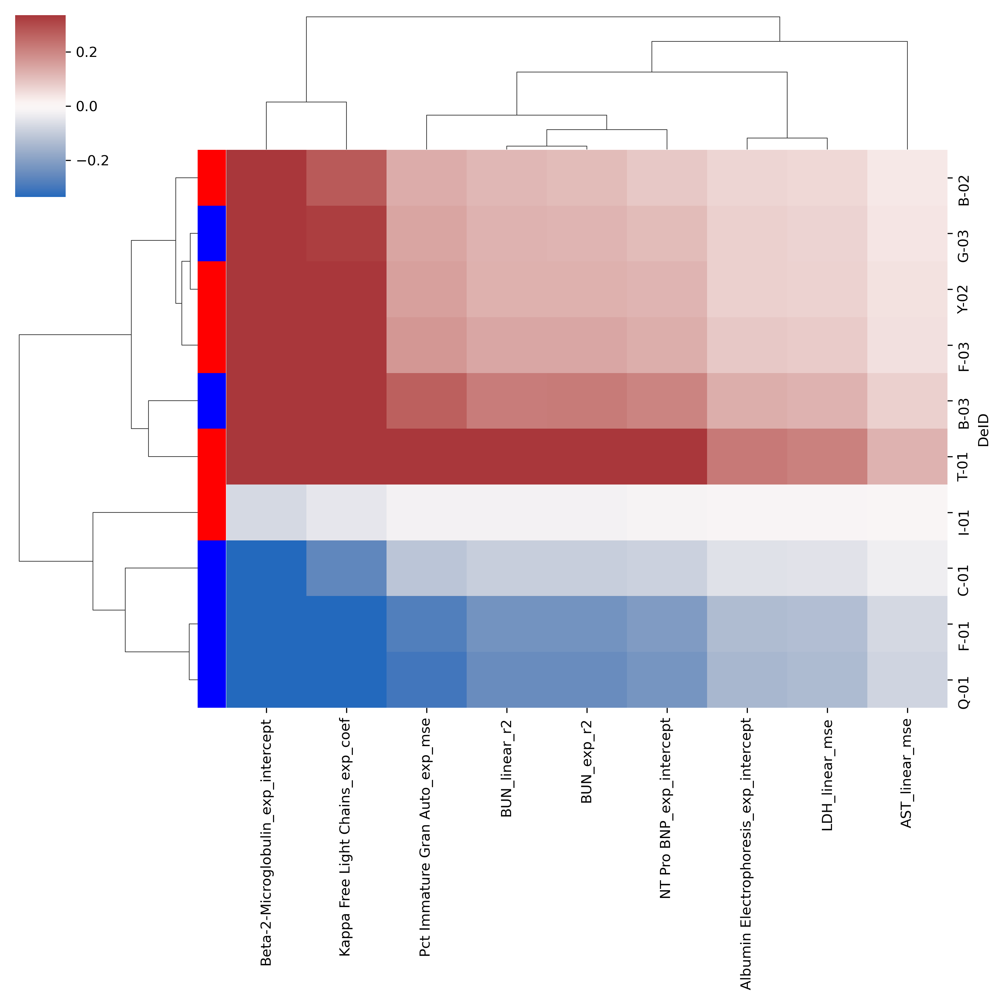

In [63]:
#version of the IG heatmap that shows only the patients in the test set
features = svm_set_ranks[selected_run].features
# IG_X = pd.DataFrame(X_test[:,features],columns = IGtable.columns)
#IG_X = X.iloc[:,features]
N = len(IGtable)


linkMeth = "average"

distMatCol = perDiff(IGtable.loc[ID_track_test])
hcCol = linkage(distMatCol, method=linkMeth,optimal_ordering=True)

tr_IGtable = IGtable.loc[ID_track_test].transpose()
distMatRow = perDiff(tr_IGtable)
hcRow = linkage(distMatRow, method=linkMeth,optimal_ordering=True)

color_val = max(np.abs((np.mean(IG)-np.std(IG), np.mean(IG)+np.std(IG))))

#fig, ax = plt.subplots()
fig = clustermap(IGtable.loc[ID_track_test], 
           yticklabels=True,
           cmap="vlag", vmin=-color_val, vmax=color_val,
           row_linkage=hcRow, col_linkage=hcCol, 
           row_colors=[["red","blue"][int(l==np.int64(0))+0] for l in y_test])

# sensitivity and specificity 

In [64]:
decision_values = svm_set_ranks[selected_run].decision_function(X_test)
y_pred = svm_set_ranks[selected_run].predict(X_test)

tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()
precision = tp/(tp+fp)
recall = tp/(tp+fn)
specificity = tn/(tn + fp)
f1 = 2*precision*recall/(precision+recall)
auc = roc_auc_score(y_test, decision_values)

print("True Negative: ", tn)
print("false positive: ", fp)
print("false negative: ", fn)
print("true positive: ", tp)
print("true positive rate or recall/sensitivity: ", recall)
print("positive predictive value or precision: ", precision)
print("specificity or true negatie rate: ", specificity)
print("auc: ", auc)
print("f1 score: ", f1)

True Negative:  3
false positive:  2
false negative:  1
true positive:  4
true positive rate or recall/sensitivity:  0.8
positive predictive value or precision:  0.6666666666666666
specificity or true negatie rate:  0.6
auc:  0.76
f1 score:  0.7272727272727272


# testing alt models on best feature list

In [65]:
X_all_trim = X_all[:,svm_set_ranks[selected_run].sorted_features.astype(int)[:svm_set_ranks[selected_run].performance_["num_features"]]]
X_train_trim = X_train[:,svm_set_ranks[selected_run].sorted_features.astype(int)[:svm_set_ranks[selected_run].performance_["num_features"]]]
X_test_trim = X_test[:,svm_set_ranks[selected_run].sorted_features.astype(int)[:svm_set_ranks[selected_run].performance_["num_features"]]]
#making the dataset only include the features from the best performing model in SVM

In [66]:
cv_set_trim = cvSet(X = X_train_trim, y = y_train.values)
cv_set_trim.classification(num_sets = numb_sets)

F1:  0.6
ROC:  0.6


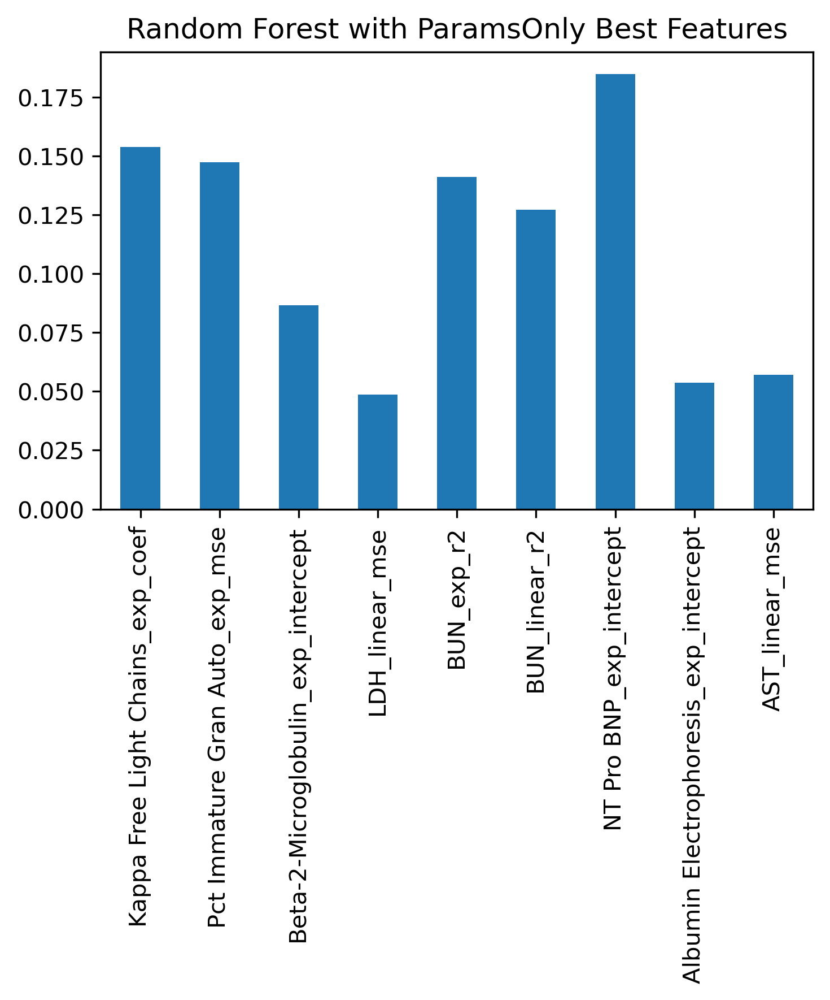

In [67]:
rnd_clf = RandomForestClassifier(random_state=0)
rnd_clf.fit(X_train_trim, y_train)
y_pred = rnd_clf.predict(X_test_trim)

print("F1: ", f1_score(y_test, y_pred, average = 'binary'))
print("ROC: ", roc_auc_score(y_test, y_pred))

importances = rnd_clf.feature_importances_
forest_importances = pd.Series(importances, index= X.columns[svm_set_ranks[selected_run].sorted_features.astype(int)[:svm_set_ranks[selected_run].performance_["num_features"]]].values)
fig, ax = plt.subplots(figsize = (5,6))
forest_importances.plot.bar(ax=ax)
ax.set_title("Random Forest with ParamsOnly Best Features")
fig.tight_layout()

F1:  0.7272727272727273
ROC:  0.7000000000000001


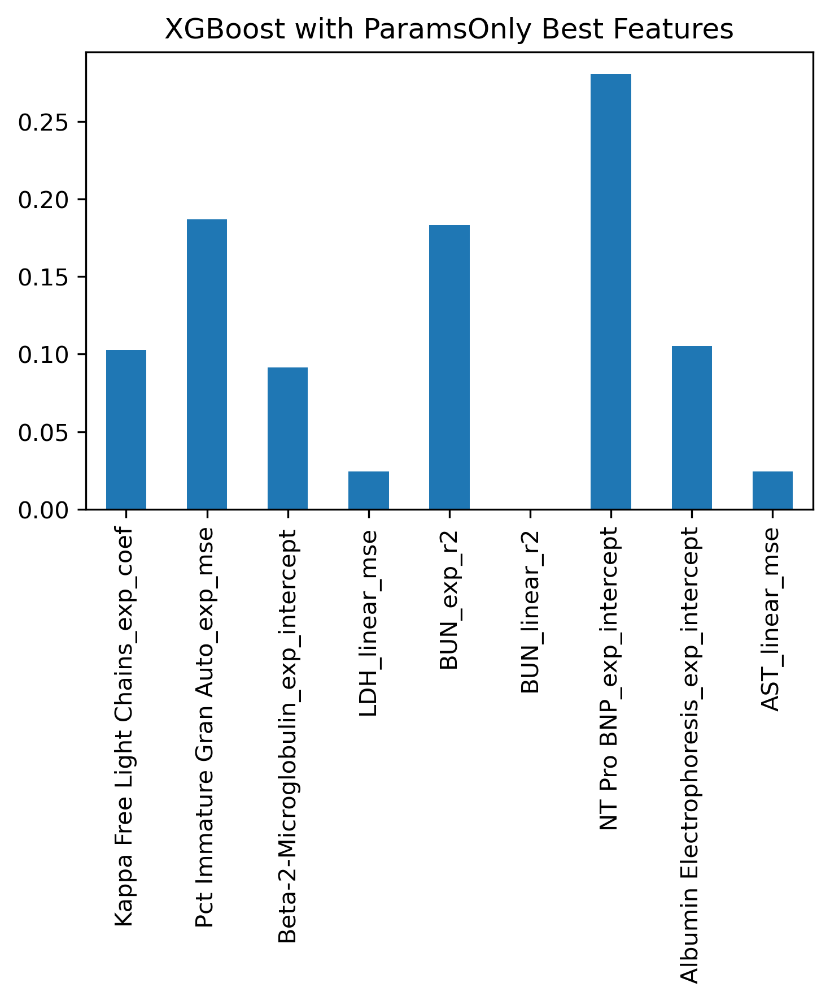

In [68]:
xgb_clf = XGBClassifier()
xgb_clf.fit(X_train_trim, y_train)
y_pred = xgb_clf.predict(X_test_trim)

print("F1: ", f1_score(y_test, y_pred, average = 'binary'))
print("ROC: ", roc_auc_score(y_test, y_pred))


importances_xgb = xgb_clf.feature_importances_
xgb_importances = pd.Series(importances_xgb, index= X.columns[svm_set_ranks[selected_run].sorted_features.astype(int)[:svm_set_ranks[selected_run].performance_["num_features"]]].values)
fig, ax = plt.subplots(figsize = (5,6))
xgb_importances.plot.bar(ax=ax)
ax.set_title("XGBoost with ParamsOnly Best Features")
fig.tight_layout()

In [69]:
# paramsLGBM = {
#     'objective': 'binary',
#     'boosting_type':'gbdt',
#     # 'num_leaves' : 45, 
#     'learning_rate' : 0.05,
#     'feature_fraction' : 0.90,
#     'min_data_in_leaf': 1
# }

# lgb_clf = lgb.LGBMClassifier(**paramsLGBM)
# lgb_clf.fit(X_train_trim, y_train)
# y_pred = lgb_clf.predict(X_test_trim)
# print("F1: ", f1_score(y_test, y_pred, average = "binary"))
# print("ROC: ", roc_auc_score(y_test, y_pred))

# print(classification_report(y_test, y_pred))

In [70]:
# #borrowed from online source
# #shap explainer
# explainer = shap.TreeExplainer(lgb_clf)

# #binary predictions
# y_proba = lgb_clf.predict_proba(X_all_trim)[:,1]

# # Calculate SHAP values for the test set
# shap_values = explainer.shap_values(X_all_trim)

# shap.summary_plot(shap_values, X_all_trim, feature_names = X.columns[svm_set_ranks[selected_run].sorted_features.astype(int)[:svm_set_ranks[selected_run].performance_["num_features"]]].values)

# # Show the plot
# plt.show()

# exporting selected features to dataframe

In [71]:
selected_features = list(X.columns[svm_set_ranks[selected_run].features]) #getting list of selected features
dataTablePositive = dataTable[dataTable[y_column_Classification] == 1] #filtering for positive patients
dataTablePositive.index = dataTablePositive['DeID'] #setting index to patient id
dataTableNegative = dataTable[dataTable[y_column_Classification] == 0] #filtering for negative patients
dataTableNegative.index = dataTableNegative['DeID'] #setting index to patient id
df_selectedfeatures_allpts = dataTable[selected_features]
df_selectedfeatures_allpts.index = dataTable['DeID'] #adding the patient identifiers back to the dataframe


#saving this output to a sheet
outputToExcel(df_data = df_selectedfeatures_allpts[selected_features], fileName_header= "SelectedFeats_", fileName_Common= fileName_common, fileName_suffix= fileName_suffix,
                    parent_dir= saving_dirrectory, folderName=makingFolder, sheetName= "all")
outputToExcel(df_data = dataTablePositive[selected_features], fileName_header= "SelectedFeats_", fileName_Common= fileName_common, fileName_suffix= fileName_suffix,
                    parent_dir= saving_dirrectory, folderName=makingFolder, sheetName= "positive")
outputToExcel(df_data = dataTableNegative[selected_features], fileName_header= "SelectedFeats_", fileName_Common= fileName_common, fileName_suffix= fileName_suffix,
                    parent_dir= saving_dirrectory, folderName=makingFolder, sheetName= "negative")


# correlation and heat maps for the best performing features of the SVM model

In [72]:
import seaborn as sns

In [73]:
dataTable

,DeID,CA_status_yes,sex_female,dx_mgus,dx_mm,age,survival(mo),ChemoTx,HematologicTx,RadiationTx,...,total CO2_exp_mse,total CO2_exp_r2,NT Pro BNP_exp_coef,NT Pro BNP_exp_intercept,NT Pro BNP_exp_mse,NT Pro BNP_exp_r2,Troponin-T_exp_coef,Troponin-T_exp_intercept,Troponin-T_exp_mse,Troponin-T_exp_r2
DeID,,,,,,,,,,,,,,,,,,,,,
B-02,B-02,1,0,1,0,48,9.466667,0,0,0,...,2.011979e-03,0.335512,0.019006,6.245677,0.000000e+00,1.000000,0.000732,0.008305,2.467598e-34,1.000000
C-03,C-03,1,1,0,1,59,17.000000,2,0,0,...,1.501745e-02,0.452717,-0.004929,8.951901,5.953865e-01,0.523501,-0.000213,0.319718,4.735415e-03,0.269301
E-01,E-01,1,0,1,0,50,71.300000,0,0,0,...,2.411961e-02,0.125011,0.001393,5.995790,1.772986e-01,0.600340,0.000042,-0.012034,7.460519e-05,0.666863
E-02,E-02,1,0,1,0,64,20.466667,0,0,0,...,1.051799e-04,0.805593,0.007529,8.267514,7.257859e-03,0.980394,-0.000104,0.105374,1.911856e-04,0.266743
F-03,F-03,1,0,0,1,61,52.000000,4,1,0,...,4.245450e-03,0.093978,-0.003033,9.097141,7.888609e-31,1.000000,0.000000,0.000000,0.000000e+00,1.000000
G-02,G-02,1,1,0,1,36,30.000000,0,0,0,...,1.148075e-02,0.000759,0.000399,8.451165,7.950137e-02,0.137007,-0.000038,0.072834,1.030609e-04,0.486790
I-01,I-01,1,1,0,1,55,33.000000,4,0,0,...,7.870229e-03,0.028986,-0.001095,6.775088,6.563729e-01,0.181926,0.000000,0.000000,0.000000e+00,1.000000
I-03,I-03,1,0,1,0,67,10.033333,0,0,0,...,4.759662e-03,0.125111,-0.002183,5.665584,4.961272e-02,0.572658,0.000000,0.000000,0.000000e+00,1.000000
J-02,J-02,1,1,0,1,68,26.000000,1,0,0,...,5.777353e-03,0.174911,-0.002956,8.795142,1.830388e-01,0.863274,-0.000024,0.019475,0.000000e+00,1.000000


In [74]:
# create correlation matrix for all the input features
feature_correlation = dataTable.drop(columns= 'DeID').corr(method='spearman')
selected_features = list(X.columns[svm_set_ranks[selected_run].features])

#for CA positive
feature_correlation_CApositive = dataTable[dataTable[y_column_Classification] == 1].drop(columns = "DeID").corr(method='spearman')

#for CA negative
feature_correlation_CAnegative = dataTable[dataTable[y_column_Classification] == 0].drop(columns = "DeID").corr(method='spearman')

In [75]:
outputToExcel(df_data = feature_correlation, fileName_header= "featureCorr_", fileName_Common= fileName_common, fileName_suffix= fileName_suffix,
                    parent_dir= saving_dirrectory, folderName=makingFolder, sheetName= "all")
outputToExcel(df_data = feature_correlation_CApositive, fileName_header= "featureCorr_", fileName_Common= fileName_common, fileName_suffix= fileName_suffix,
                    parent_dir= saving_dirrectory, folderName=makingFolder, sheetName= "allCApos")
outputToExcel(df_data = feature_correlation_CAnegative, fileName_header= "featureCorr_", fileName_Common= fileName_common, fileName_suffix= fileName_suffix,
                    parent_dir= saving_dirrectory, folderName=makingFolder, sheetName= "allCAneg")

/blue/ferrallm/mcremer/.conda/envs/mcremerConda_2024-07-15_v1/lib/python3.12/site-packages/openpyxl/workbook/child.py:99: UserWarning:

Title is more than 31 characters. Some applications may not be able to read the file



In [76]:
colormap = "RdBu"

/blue/ferrallm/mcremer/.conda/envs/mcremerConda_2024-07-15_v1/lib/python3.12/site-packages/openpyxl/workbook/child.py:99: UserWarning:

Title is more than 31 characters. Some applications may not be able to read the file

/blue/ferrallm/mcremer/.conda/envs/mcremerConda_2024-07-15_v1/lib/python3.12/site-packages/openpyxl/workbook/child.py:99: UserWarning:

Title is more than 31 characters. Some applications may not be able to read the file

/blue/ferrallm/mcremer/.conda/envs/mcremerConda_2024-07-15_v1/lib/python3.12/site-packages/openpyxl/workbook/child.py:99: UserWarning:

Title is more than 31 characters. Some applications may not be able to read the file

/blue/ferrallm/mcremer/.conda/envs/mcremerConda_2024-07-15_v1/lib/python3.12/site-packages/openpyxl/workbook/child.py:99: UserWarning:

Title is more than 31 characters. Some applications may not be able to read the file

/blue/ferrallm/mcremer/.conda/envs/mcremerConda_2024-07-15_v1/lib/python3.12/site-packages/openpyxl/workbook/chi

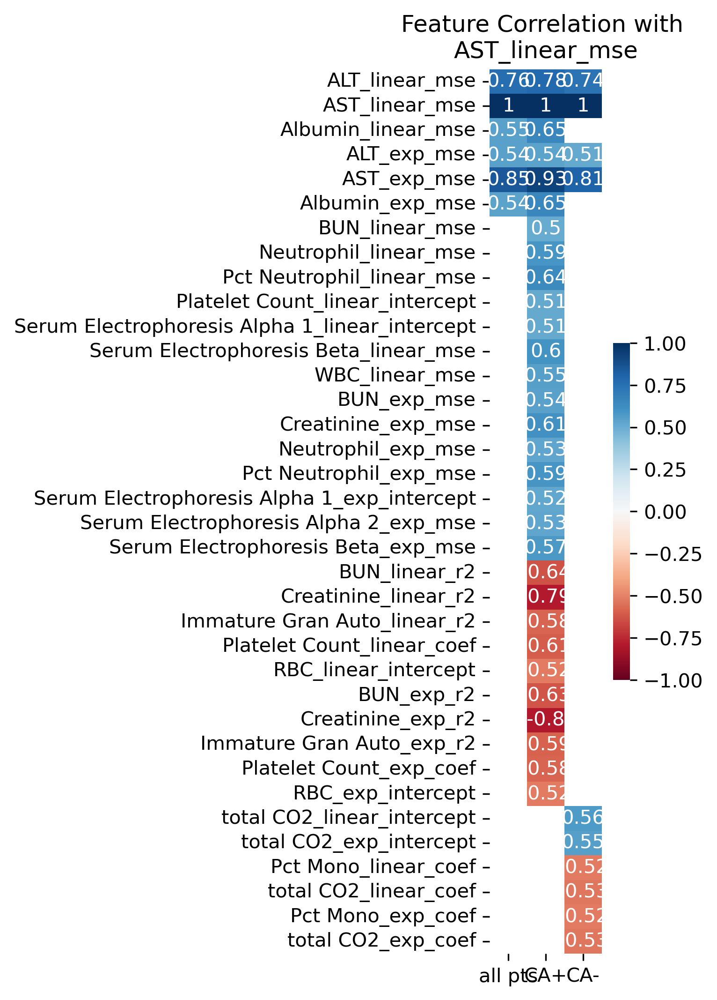

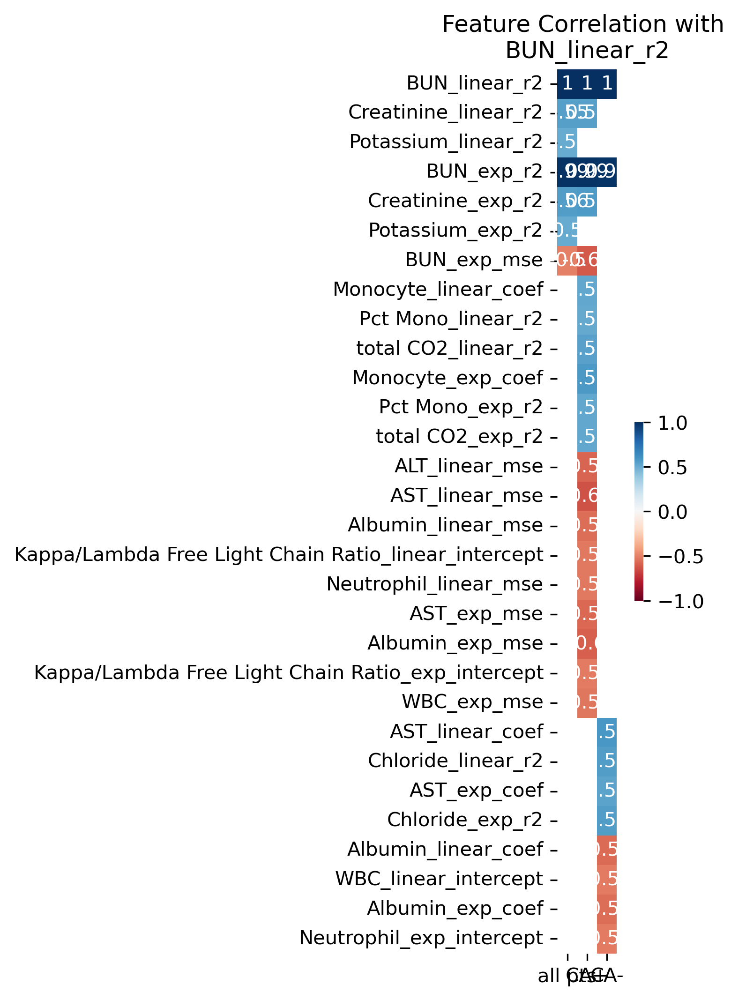

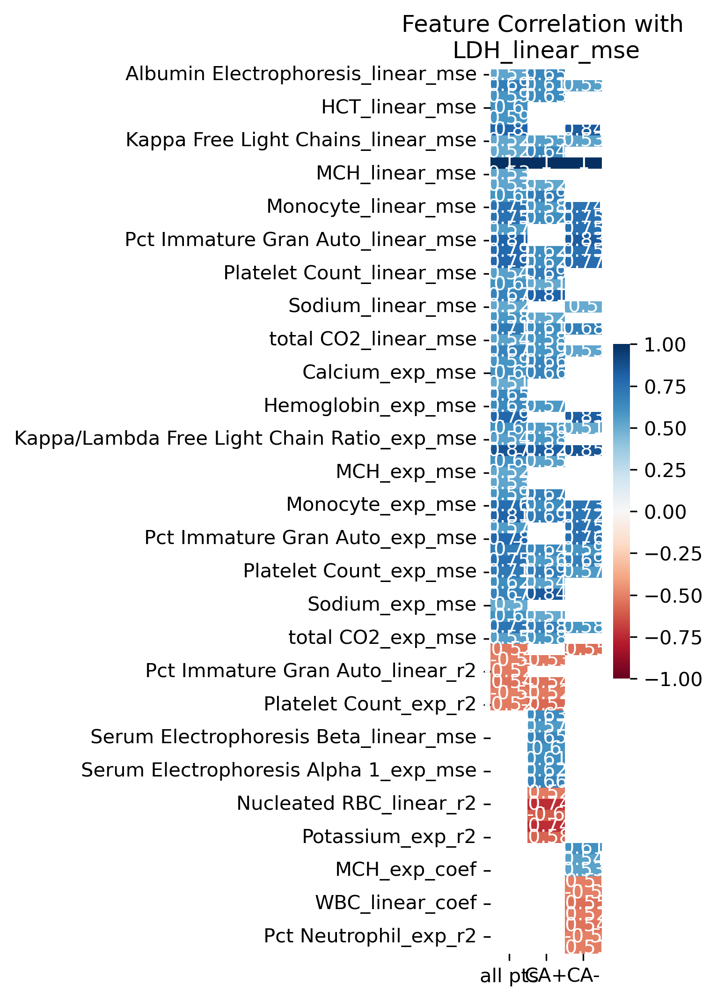

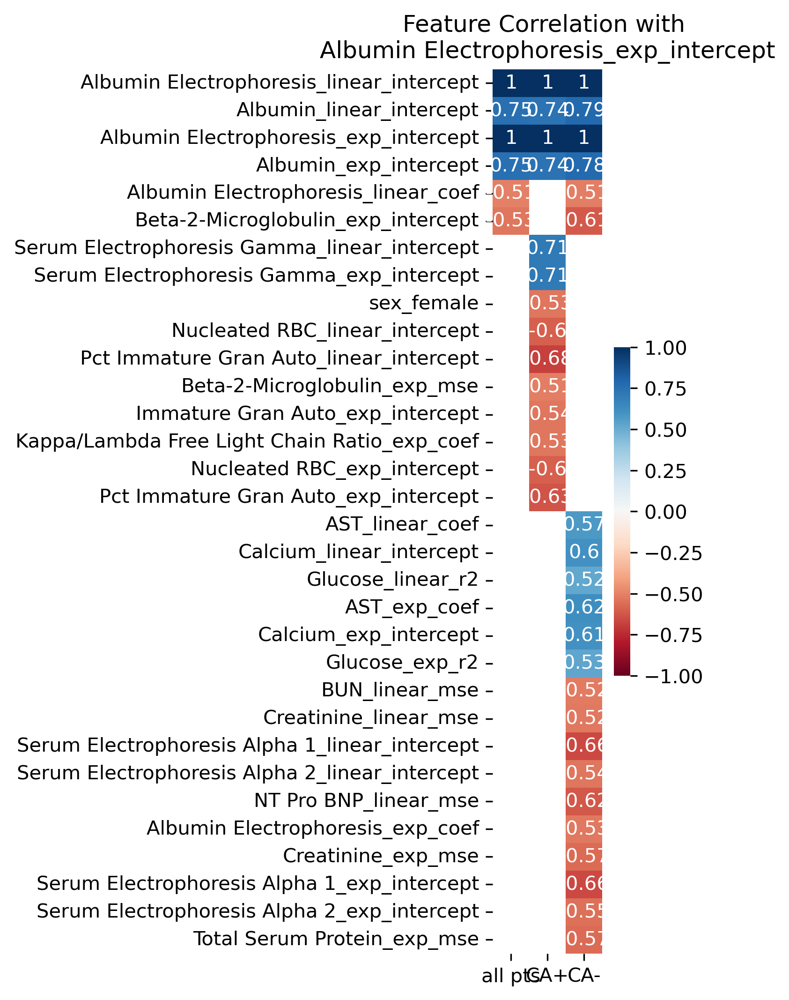

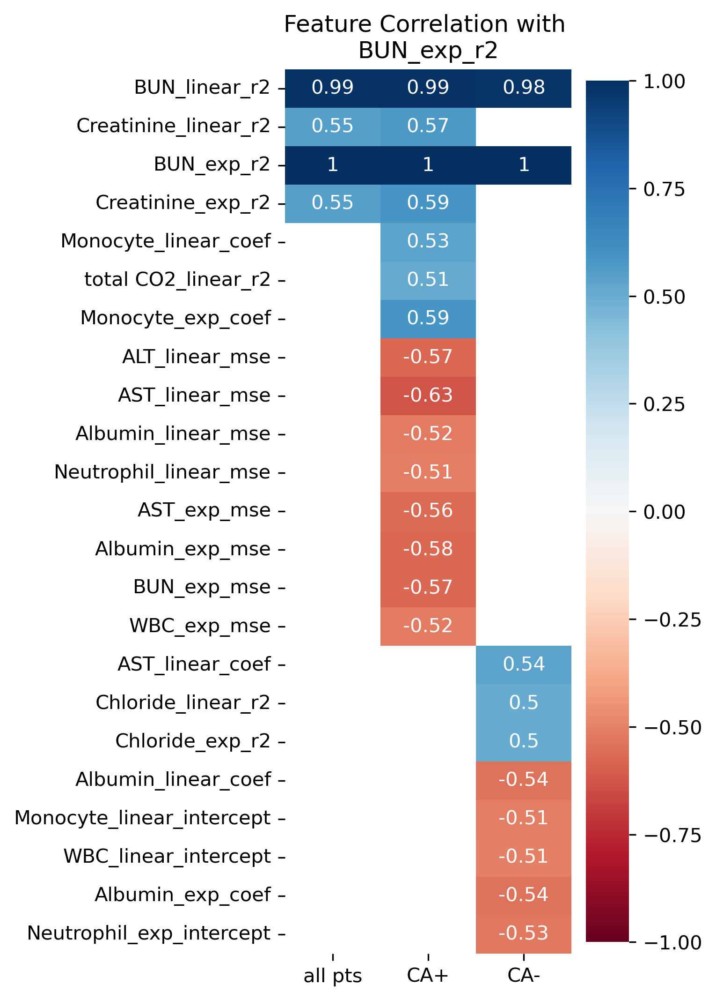

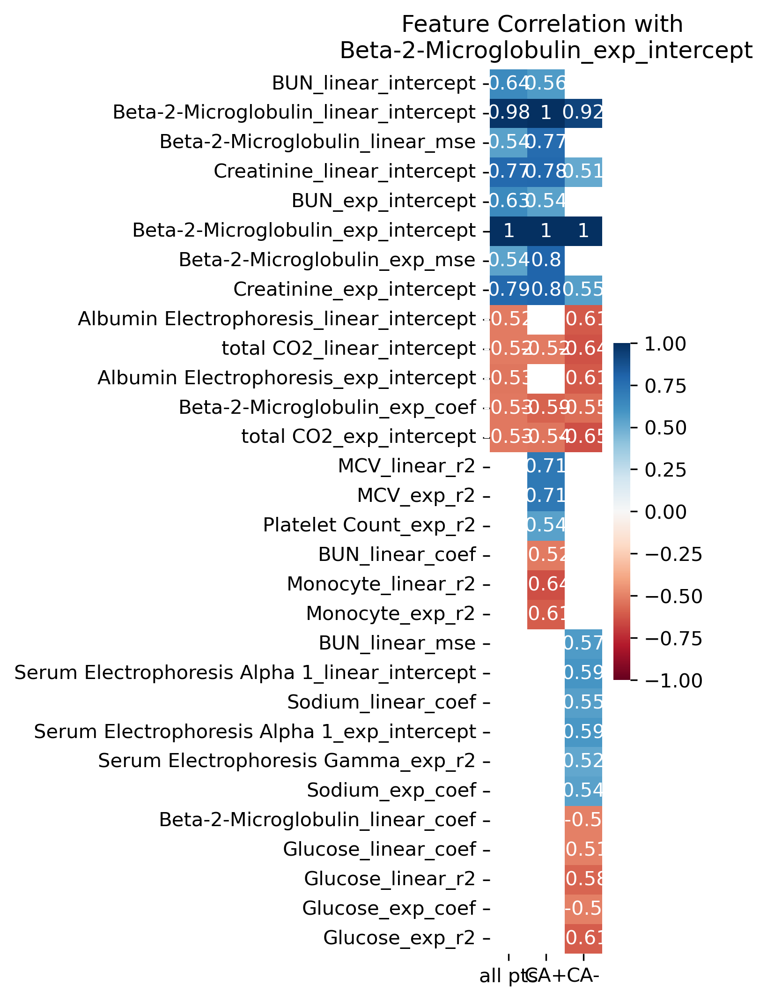

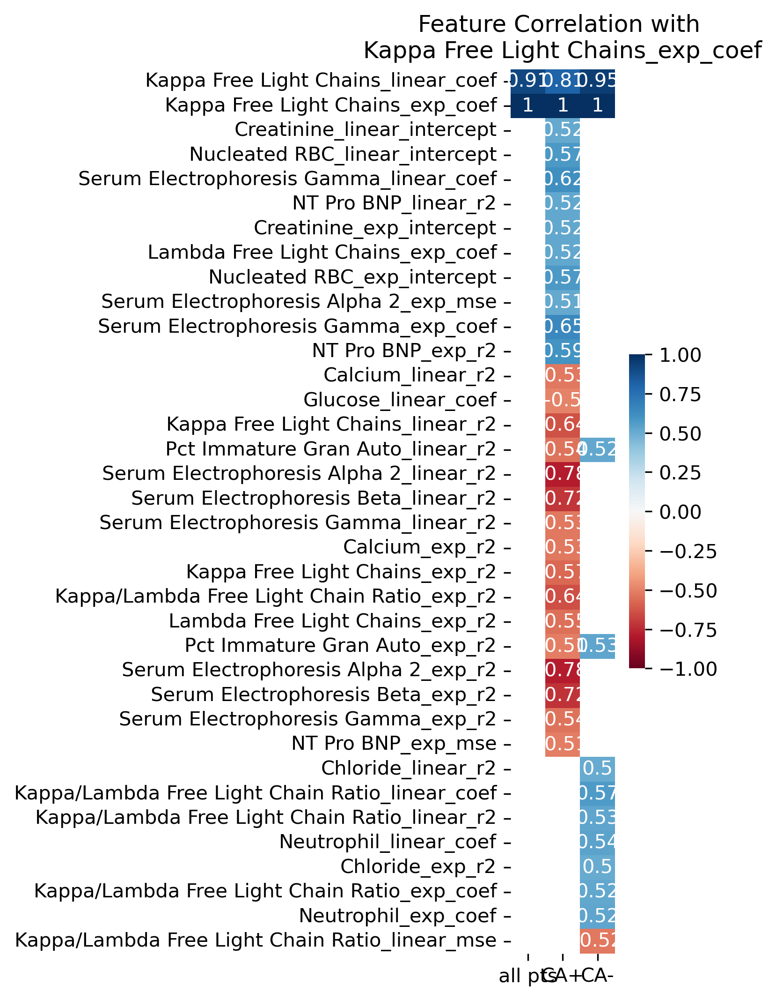

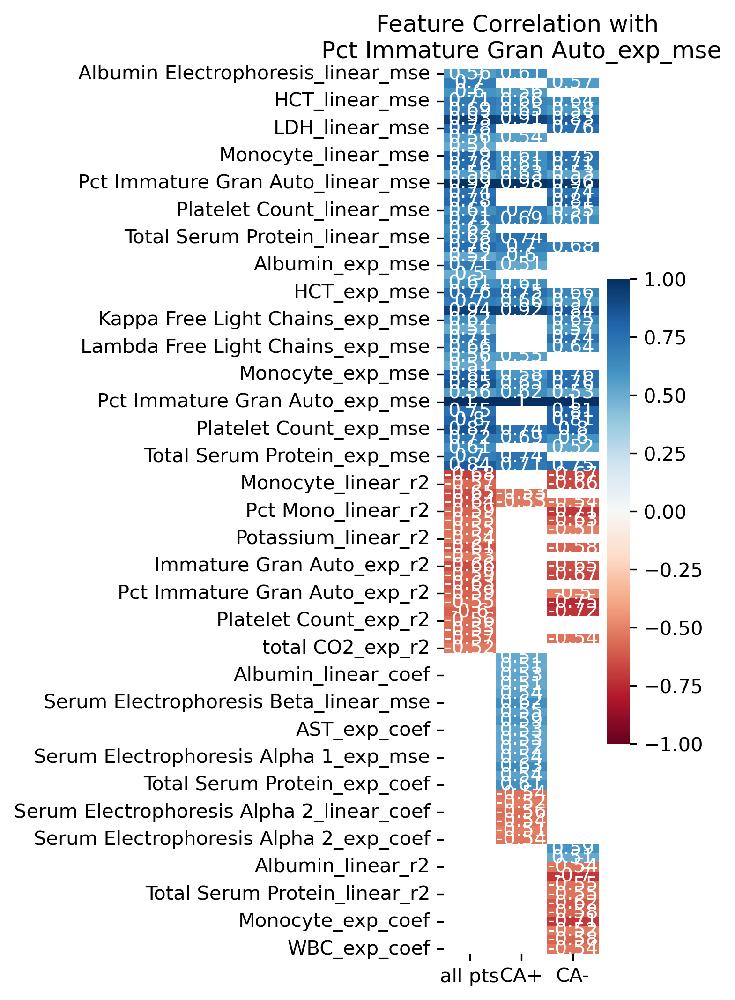

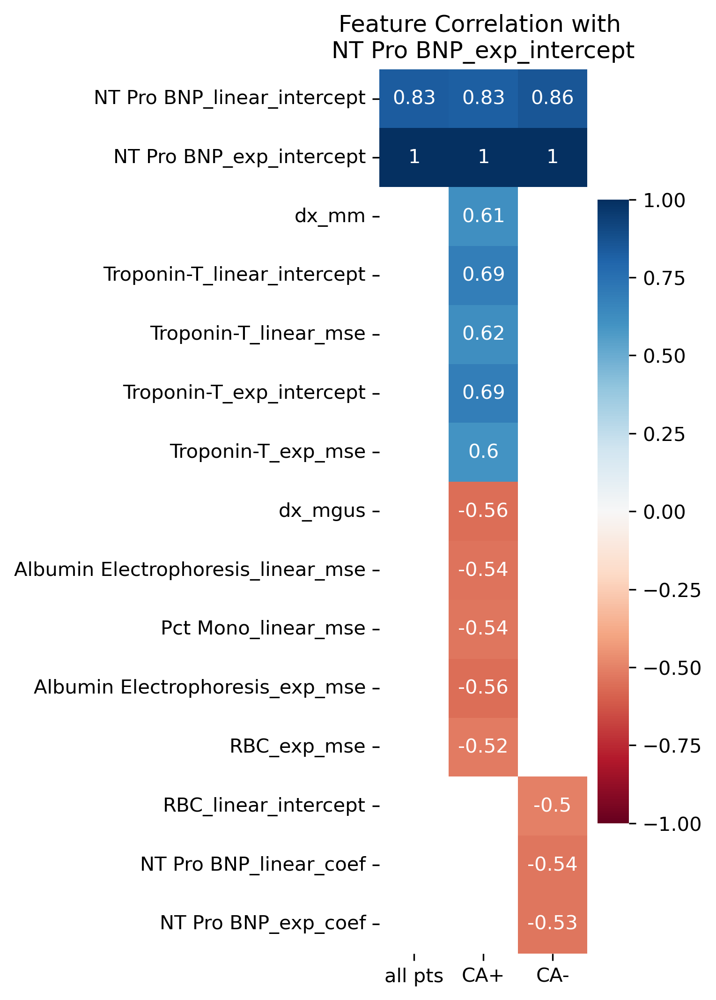

In [77]:
for feature_name in selected_features:
    feat_corr_sig_allpts = pd.concat([feature_correlation[feature_correlation[feature_name]>=0.5][feature_name], 
                                    feature_correlation[feature_correlation[feature_name]<=-0.5][feature_name]], axis = 0)

    feat_corr_sig_CApos = pd.concat([feature_correlation_CApositive[feature_correlation_CApositive[feature_name]>=0.5][feature_name], 
                                     feature_correlation_CApositive[feature_correlation_CApositive[feature_name]<=-0.5][feature_name]], axis = 0)

    feat_corr_sig_CAneg = pd.concat([feature_correlation_CAnegative[feature_correlation_CAnegative[feature_name]>=0.5][feature_name],
                                     feature_correlation_CAnegative[feature_correlation_CAnegative[feature_name]<=-0.5][feature_name]], axis = 0)

    feat_corr_sig_concat = pd.concat([feat_corr_sig_allpts,feat_corr_sig_CApos,feat_corr_sig_CAneg], axis = 1)
    feat_corr_sig_concat.columns = ['all pts', 'CA+', 'CA-']

    outputToExcel(df_data = feat_corr_sig_concat, fileName_header= "featureCorr_", fileName_Common= fileName_common, fileName_suffix= fileName_suffix ,
                       parent_dir= saving_dirrectory, folderName=makingFolder, sheetName=feature_name.replace("%", "").replace("/",""))

    fig, ax = plt.subplots(figsize = (5,7),layout = 'constrained')
    sns.heatmap(feat_corr_sig_concat, cmap= colormap, vmin= -1, vmax = 1, center = 0, annot = True, ax = ax)
    ax.set_title("Feature Correlation with \n"+ str(feature_name))

    figCommon =feature_name.replace("%", "").replace("/","") + "_heatmap_"
    # fig_file_out = ptFn.outputFiguresPath(fileName_header="", fileName_mid=figCommon, 
    #                         fileName_suff= fileNameSuffix, parent_dir=parent_dir, folderName=folder_data_out)
    # fig.savefig(fig_file_out, bbox_inches = 'tight')
    # fig_file_out_jpg = ptFn.outputFiguresPath(fileName_header="", fileName_mid=figCommon, 
    #                 fileName_suff= fileNameSuffix, parent_dir=parent_dir, folderName=folder_data_out, fileExtension= '.jpg')
    # fig.savefig(fig_file_out_jpg, bbox_inches = 'tight')